In [2]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)

Extracting mnist: 100%|██████████| 60.0k/60.0k [00:07<00:00, 7.85kFile/s]


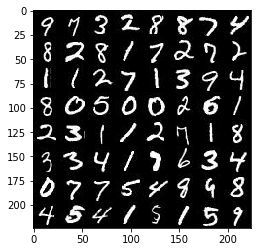

In [7]:
show_n_images = 79

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

/home/shahidul/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/shahidul/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/shahidul/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/shahidul/.local/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.

TensorFlow Version: 1.14.0
Default GPU Device: /device:GPU:0


In [18]:


import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function

    real_input = tf.placeholder(tf.float32,(None,image_width,image_height,image_channels),name='input_real')
    z_input = tf.placeholder(tf.float32,(None,z_dim),name='input_z')
    learning_rate = tf.placeholder(tf.float32)
    return (real_input,z_input,learning_rate)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)




Tests Passed


In [19]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function
    alpha = .01
    with tf.variable_scope('discriminator',reuse=reuse):
        x1 = tf.layers.conv2d(images, 64, 5, strides=2, kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        relu1 = tf.maximum(alpha * x1, x1)
        # 14x14x64
        
        x2 = tf.layers.conv2d(relu1, 128, 5, strides=2, kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        bn2 = tf.layers.batch_normalization(x2, training=True)
        relu2 = tf.maximum(alpha * bn2, bn2)
        # 7x7x128
        
        x3 = tf.layers.conv2d(relu2, 256, 5, strides=2, kernel_initializer=tf.contrib.layers.xavier_initializer(), padding='same')
        bn3 = tf.layers.batch_normalization(x3, training=True)
        relu3 = tf.maximum(alpha * bn3, bn3)
        # 4x4x256
        
        flat = tf.reshape(relu3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        out = tf.sigmoid(logits)
        
        return(out,logits)
        

    


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)



ERROR:tensorflow:==================================
Object was never used (type <class 'tensorflow.python.framework.ops.Operation'>):
<tf.Operation 'assert_rank_2/Assert/Assert' type=Assert>
If you want to mark it as used call its "mark_used()" method.
It was originally created here:
  File "/home/shahidul/.local/lib/python3.6/site-packages/IPython/core/interactiveshell.py", line 3346, in run_code
    return outflag  File "<ipython-input-18-27f6e3bd3f5a>", line 23, in <module>
    tests.test_model_inputs(model_inputs)  File "/home/shahidul/Desktop/cavid/MNIST GAN/problem_unittests.py", line 14, in func_wrapper
    return result  File "/home/shahidul/Desktop/cavid/MNIST GAN/problem_unittests.py", line 68, in test_model_inputs
    _check_input(learn_rate, [], 'Learning Rate')  File "/home/shahidul/Desktop/cavid/MNIST GAN/problem_unittests.py", line 38, in _check_input
    '{} has bad name.  Found name {}'.format(display_name, tensor.name)  File "/home/shahidul/Desktop/cavid/MNIST GAN/p

Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Tests Passed


In [20]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    # TODO: Implement Function
    reuse = not is_train
    
    with tf.variable_scope('generator',reuse=reuse):
        alpha=.2
         # First fully connected layer
        x1 = tf.layers.dense(z, 7*7*512)
        # Reshape it to start the convolutional stack
        x1 = tf.reshape(x1, (-1, 7, 7, 256))
        x1 = tf.layers.batch_normalization(x1, training=is_train)
        x1 = tf.maximum(alpha * x1, x1)
        # 7x7x512 now
        
        x2 = tf.layers.conv2d_transpose(x1, 128, 5, strides=2, padding='same')
        x2 = tf.layers.batch_normalization(x2, training=is_train)
        x2 = tf.maximum(alpha * x2, x2)
        # 14x14x256 now
        
        # Output layer
        logits = tf.layers.conv2d_transpose(x2,out_channel_dim,5, strides=2, padding='same')
       
        
        out = tf.tanh(logits)
        
        return(out)


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Instructions for updating:
Use `tf.keras.layers.Conv2DTranspose` instead.


Tests Passed


In [21]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    smooth = .1
    g_model = generator(input_z,out_channel_dim)
    d_model_real,d_logits_real = discriminator(input_real,reuse=False)
    d_model_fake,d_logits_fake = discriminator(g_model,reuse=True)
    
    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_real,
                                                                        labels = tf.ones_like(
                                                                        d_model_real)*(1-smooth)))
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake,
                                                                        labels = tf.zeros_like(
                                                                        d_model_fake)))
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits = d_logits_fake,
                                                                   labels = tf.ones_like(d_model_fake)))
    
    d_loss = d_loss_real + d_loss_fake
    
    
    return d_loss,g_loss


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Instructions for updating:
Use tf.where in 2.0, which has the same broadcast rule as np.where
Tests Passed


In [22]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    t_variables = tf.trainable_variables()
    d_variables = [var for var in t_variables if var.name.startswith('discriminator')]
    g_variables = [var for var in t_variables if var.name.startswith('generator')]
    
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_optimiser = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(d_loss,var_list=d_variables)
        g_train_optimiser = tf.train.AdamOptimizer(learning_rate,beta1=beta1).minimize(g_loss,var_list=g_variables)
    
    return d_train_optimiser,g_train_optimiser


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)


Tests Passed


In [24]:
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

In [25]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    width,height,channel = data_shape[1],data_shape[2],data_shape[3]
    
    real_input,z_input,learn_rate = model_inputs(width,height,channel,z_dim)
    
    d_loss,g_loss = model_loss(real_input,z_input,channel)
    
    d_opt,g_opt = model_opt(d_loss,g_loss,learning_rate,beta1)
    
    saver = tf.train.Saver()

    steps = 0
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                batch_images *= 2
                steps += 1
                
                #sample random nosie for G
                batch_z = np.random.uniform(-1,1,size=(batch_size,z_dim))
                
                #optimiser running
                _ = sess.run(d_opt,feed_dict={real_input : batch_images,
                                             z_input : batch_z,
                                             learn_rate : learning_rate})
                _ = sess.run(g_opt,feed_dict={z_input : batch_z,
                                             real_input : batch_images,
                                             learn_rate : learning_rate})
                if steps%100 ==0:
                    train_loss_d = d_loss.eval({z_input: batch_z,real_input:batch_images})
                    train_loss_g = g_loss.eval({z_input: batch_z})
                    
                    print("Epoch {}/{}..., step {}".format(epoch_i+1, epochs, steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                if steps % 100 == 0:
                    show_generator_output(sess, 16, z_input, channel, data_image_mode)
                    
                
        saver.save(sess, './generator.ckpt')

Epoch 1/20..., step 100 Discriminator Loss: 0.8279... Generator Loss: 1.3009


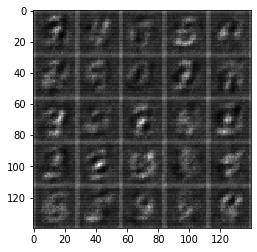

Epoch 1/20..., step 200 Discriminator Loss: 0.9166... Generator Loss: 1.1666


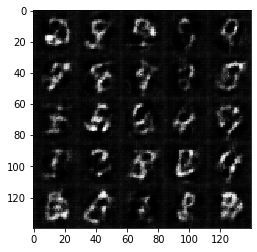

Epoch 1/20..., step 300 Discriminator Loss: 0.8596... Generator Loss: 1.1103


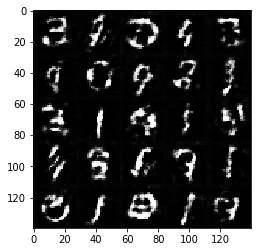

Epoch 1/20..., step 400 Discriminator Loss: 0.8146... Generator Loss: 1.6821


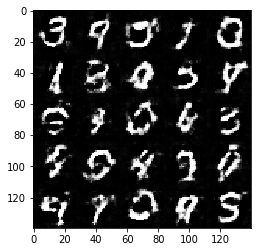

Epoch 1/20..., step 500 Discriminator Loss: 0.6749... Generator Loss: 2.2798


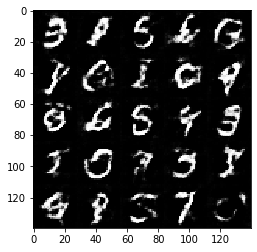

Epoch 1/20..., step 600 Discriminator Loss: 0.8289... Generator Loss: 1.2009


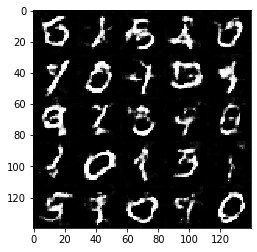

Epoch 1/20..., step 700 Discriminator Loss: 1.0639... Generator Loss: 0.8157


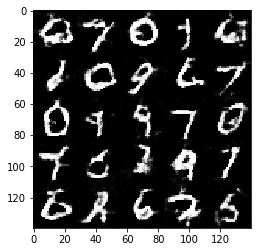

Epoch 1/20..., step 800 Discriminator Loss: 0.7059... Generator Loss: 1.4643


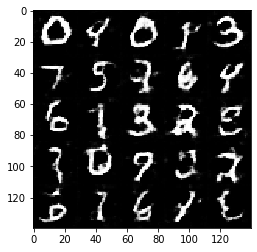

Epoch 1/20..., step 900 Discriminator Loss: 0.9202... Generator Loss: 0.9962


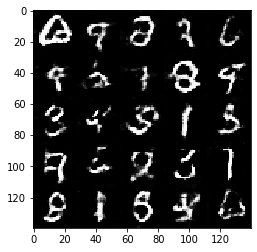

Epoch 1/20..., step 1000 Discriminator Loss: 1.6868... Generator Loss: 0.4644


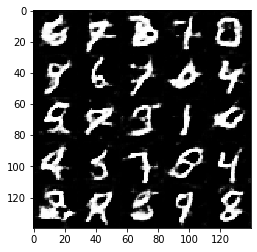

Epoch 1/20..., step 1100 Discriminator Loss: 1.1620... Generator Loss: 0.7290


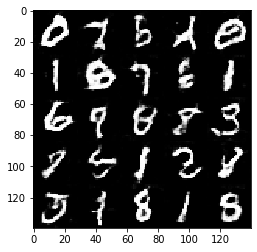

Epoch 1/20..., step 1200 Discriminator Loss: 0.7039... Generator Loss: 1.4332


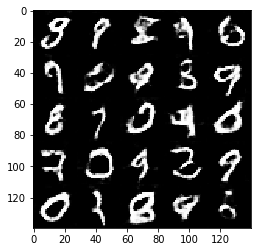

Epoch 1/20..., step 1300 Discriminator Loss: 0.8852... Generator Loss: 0.9996


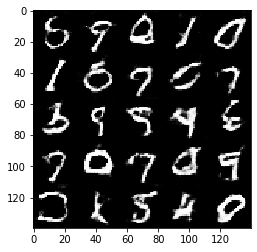

Epoch 1/20..., step 1400 Discriminator Loss: 0.8911... Generator Loss: 1.0321


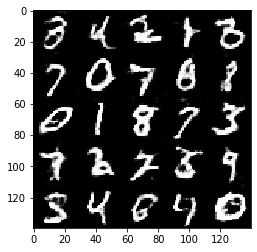

Epoch 1/20..., step 1500 Discriminator Loss: 1.0298... Generator Loss: 0.8763


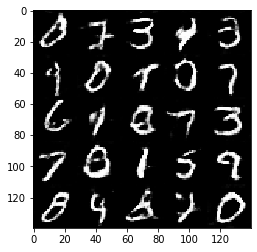

Epoch 1/20..., step 1600 Discriminator Loss: 0.8302... Generator Loss: 1.1607


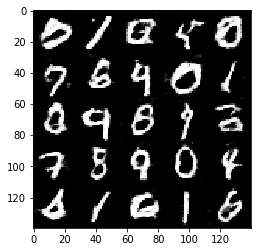

Epoch 1/20..., step 1700 Discriminator Loss: 1.0745... Generator Loss: 0.8249


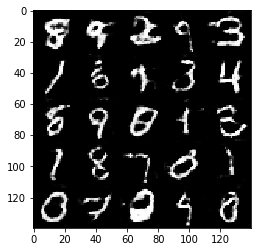

Epoch 1/20..., step 1800 Discriminator Loss: 0.7936... Generator Loss: 1.1700


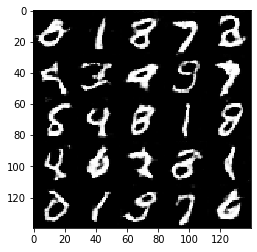

Epoch 2/20..., step 1900 Discriminator Loss: 0.9625... Generator Loss: 0.9472


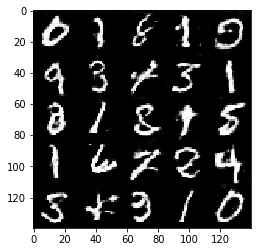

Epoch 2/20..., step 2000 Discriminator Loss: 0.7129... Generator Loss: 1.2821


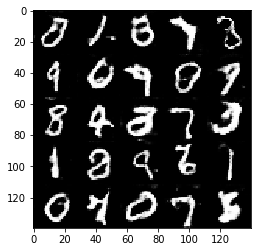

Epoch 2/20..., step 2100 Discriminator Loss: 0.6616... Generator Loss: 1.6309


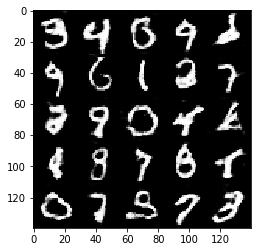

Epoch 2/20..., step 2200 Discriminator Loss: 0.5690... Generator Loss: 1.9894


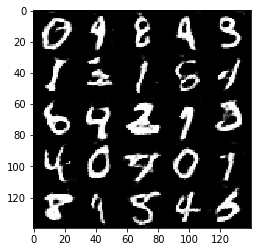

Epoch 2/20..., step 2300 Discriminator Loss: 0.6259... Generator Loss: 1.6036


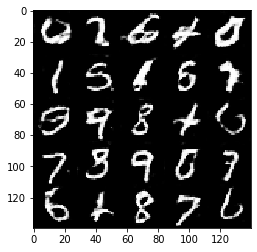

Epoch 2/20..., step 2400 Discriminator Loss: 0.6071... Generator Loss: 1.7185


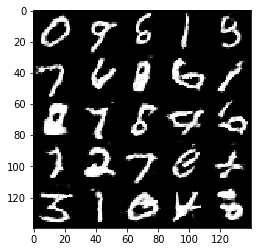

Epoch 2/20..., step 2500 Discriminator Loss: 0.6150... Generator Loss: 2.1777


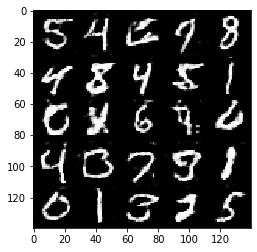

Epoch 2/20..., step 2600 Discriminator Loss: 0.5642... Generator Loss: 1.8954


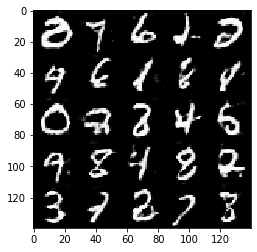

Epoch 2/20..., step 2700 Discriminator Loss: 0.5979... Generator Loss: 3.0071


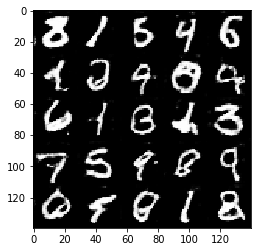

Epoch 2/20..., step 2800 Discriminator Loss: 0.4806... Generator Loss: 2.4472


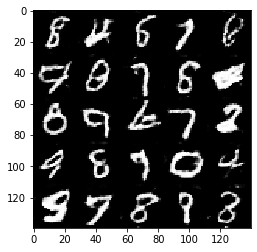

Epoch 2/20..., step 2900 Discriminator Loss: 0.5590... Generator Loss: 1.9876


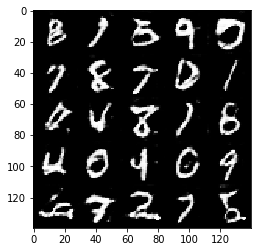

Epoch 2/20..., step 3000 Discriminator Loss: 0.6212... Generator Loss: 1.6019


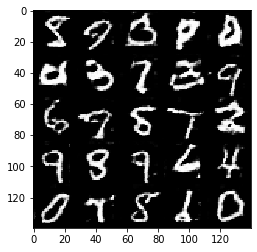

Epoch 2/20..., step 3100 Discriminator Loss: 0.4805... Generator Loss: 2.8371


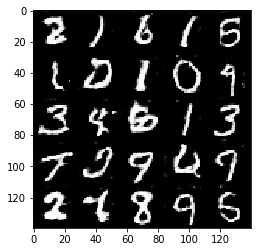

Epoch 2/20..., step 3200 Discriminator Loss: 0.7677... Generator Loss: 1.3166


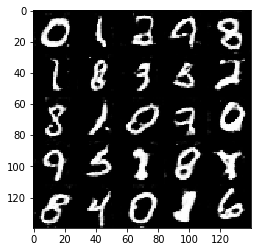

Epoch 2/20..., step 3300 Discriminator Loss: 0.5271... Generator Loss: 2.1377


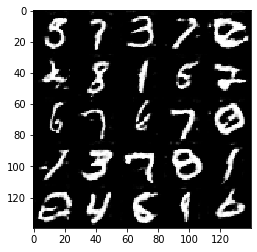

Epoch 2/20..., step 3400 Discriminator Loss: 0.4694... Generator Loss: 2.5126


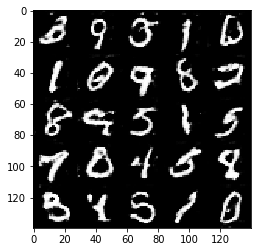

Epoch 2/20..., step 3500 Discriminator Loss: 0.4897... Generator Loss: 2.3851


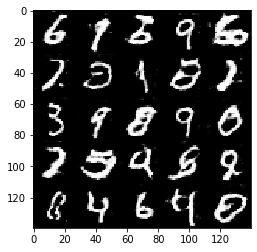

Epoch 2/20..., step 3600 Discriminator Loss: 0.4506... Generator Loss: 2.6351


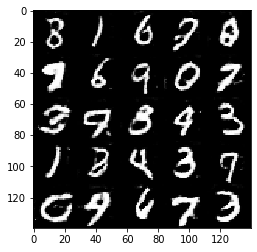

Epoch 2/20..., step 3700 Discriminator Loss: 0.5673... Generator Loss: 1.8198


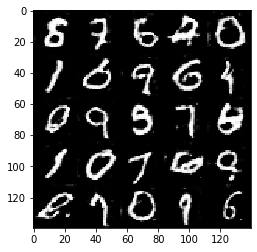

Epoch 3/20..., step 3800 Discriminator Loss: 0.9538... Generator Loss: 1.1046


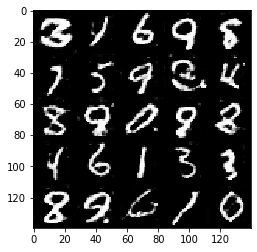

Epoch 3/20..., step 3900 Discriminator Loss: 0.5972... Generator Loss: 1.6714


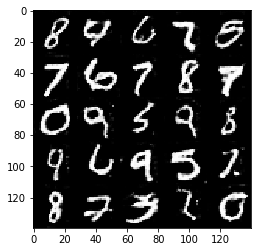

Epoch 3/20..., step 4000 Discriminator Loss: 0.4860... Generator Loss: 2.5258


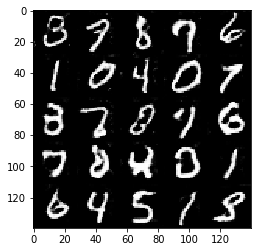

Epoch 3/20..., step 4100 Discriminator Loss: 0.4685... Generator Loss: 2.5080


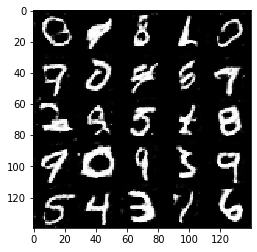

Epoch 3/20..., step 4200 Discriminator Loss: 0.5936... Generator Loss: 1.7570


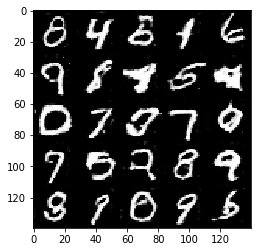

Epoch 3/20..., step 4300 Discriminator Loss: 1.7358... Generator Loss: 0.4557


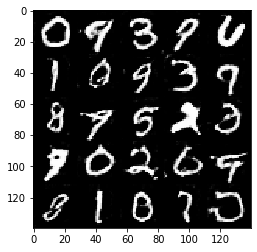

Epoch 3/20..., step 4400 Discriminator Loss: 0.4927... Generator Loss: 2.3366


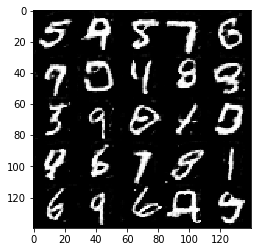

Epoch 3/20..., step 4500 Discriminator Loss: 0.4473... Generator Loss: 2.5219


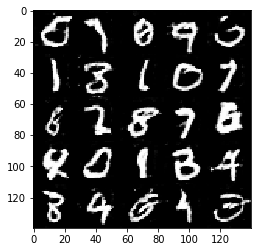

Epoch 3/20..., step 4600 Discriminator Loss: 1.2533... Generator Loss: 0.8365


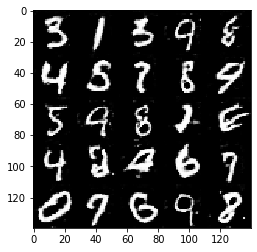

Epoch 3/20..., step 4700 Discriminator Loss: 0.4580... Generator Loss: 2.4551


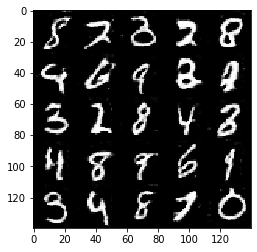

Epoch 3/20..., step 4800 Discriminator Loss: 0.5256... Generator Loss: 2.4948


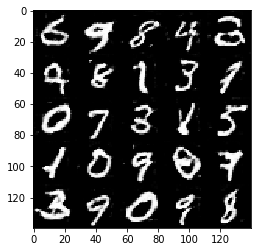

Epoch 3/20..., step 4900 Discriminator Loss: 0.5279... Generator Loss: 2.0289


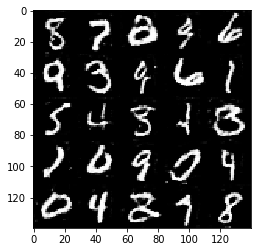

Epoch 3/20..., step 5000 Discriminator Loss: 0.5663... Generator Loss: 1.8680


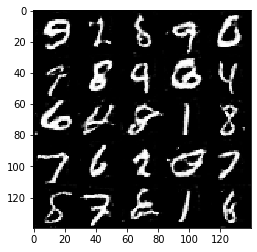

Epoch 3/20..., step 5100 Discriminator Loss: 0.9549... Generator Loss: 1.0545


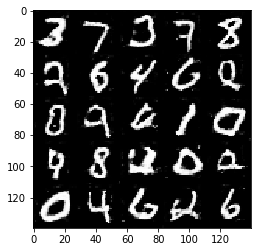

Epoch 3/20..., step 5200 Discriminator Loss: 0.4512... Generator Loss: 2.5146


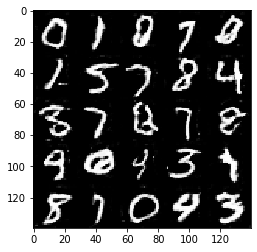

Epoch 3/20..., step 5300 Discriminator Loss: 0.4609... Generator Loss: 2.5218


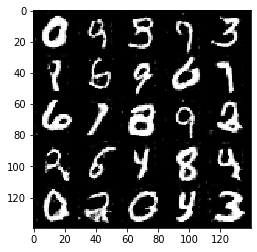

Epoch 3/20..., step 5400 Discriminator Loss: 0.4256... Generator Loss: 2.9067


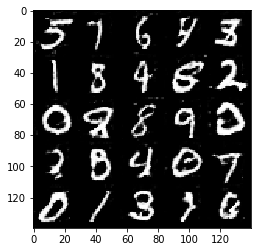

Epoch 3/20..., step 5500 Discriminator Loss: 0.7377... Generator Loss: 1.4271


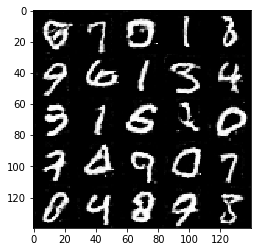

Epoch 3/20..., step 5600 Discriminator Loss: 0.4711... Generator Loss: 2.3377


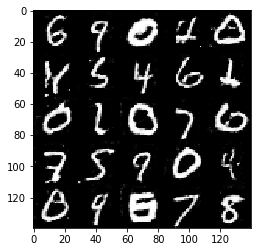

Epoch 4/20..., step 5700 Discriminator Loss: 0.5244... Generator Loss: 2.0916


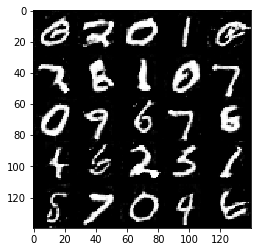

Epoch 4/20..., step 5800 Discriminator Loss: 2.5945... Generator Loss: 0.2961


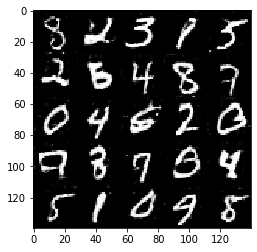

Epoch 4/20..., step 5900 Discriminator Loss: 0.4737... Generator Loss: 2.3075


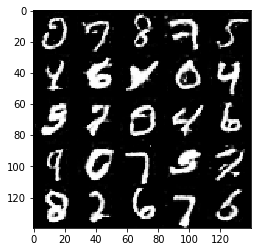

Epoch 4/20..., step 6000 Discriminator Loss: 0.5470... Generator Loss: 1.9347


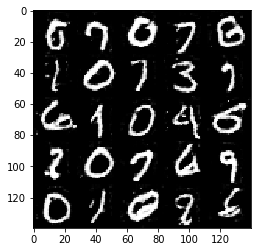

Epoch 4/20..., step 6100 Discriminator Loss: 0.4952... Generator Loss: 2.2800


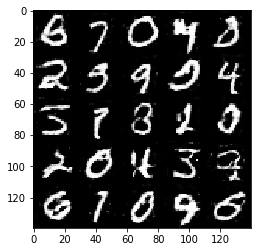

Epoch 4/20..., step 6200 Discriminator Loss: 0.6079... Generator Loss: 1.7276


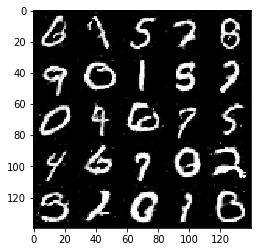

Epoch 4/20..., step 6300 Discriminator Loss: 0.4673... Generator Loss: 2.9751


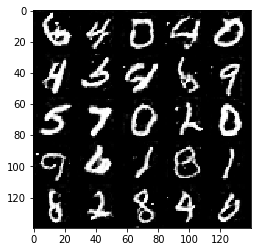

Epoch 4/20..., step 6400 Discriminator Loss: 0.5286... Generator Loss: 2.0930


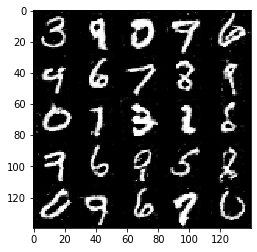

Epoch 4/20..., step 6500 Discriminator Loss: 0.6293... Generator Loss: 1.6649


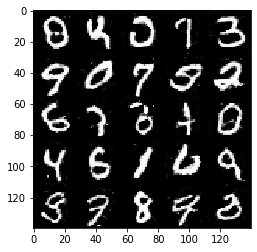

Epoch 4/20..., step 6600 Discriminator Loss: 0.5924... Generator Loss: 1.8890


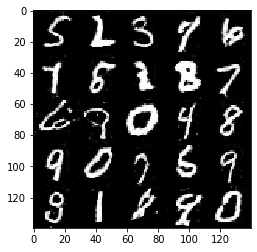

Epoch 4/20..., step 6700 Discriminator Loss: 0.4554... Generator Loss: 3.5746


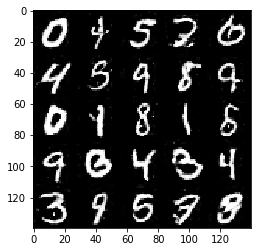

Epoch 4/20..., step 6800 Discriminator Loss: 0.4186... Generator Loss: 2.7161


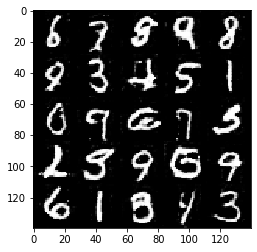

Epoch 4/20..., step 6900 Discriminator Loss: 0.4980... Generator Loss: 2.6529


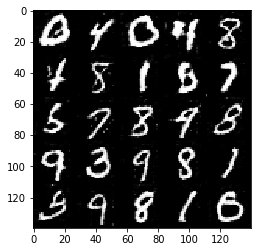

Epoch 4/20..., step 7000 Discriminator Loss: 0.5214... Generator Loss: 2.6623


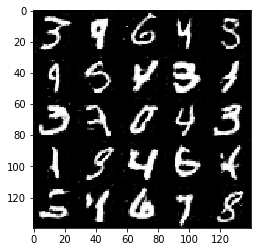

Epoch 4/20..., step 7100 Discriminator Loss: 0.4384... Generator Loss: 2.7352


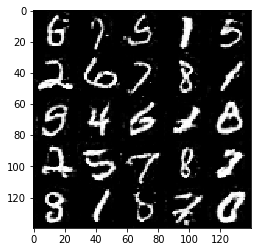

Epoch 4/20..., step 7200 Discriminator Loss: 0.5811... Generator Loss: 1.7364


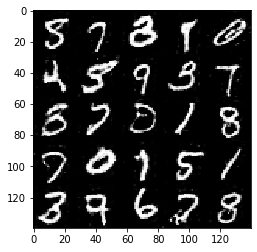

Epoch 4/20..., step 7300 Discriminator Loss: 0.4983... Generator Loss: 2.1778


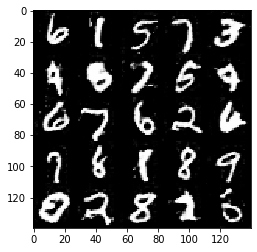

Epoch 4/20..., step 7400 Discriminator Loss: 0.5385... Generator Loss: 1.8552


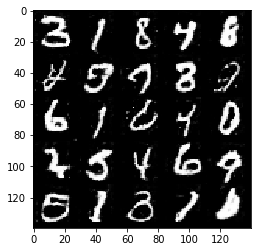

Epoch 4/20..., step 7500 Discriminator Loss: 0.6897... Generator Loss: 1.4295


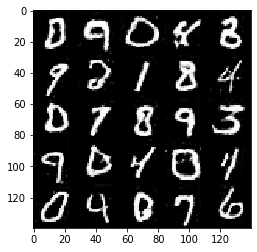

Epoch 5/20..., step 7600 Discriminator Loss: 0.4186... Generator Loss: 2.7849


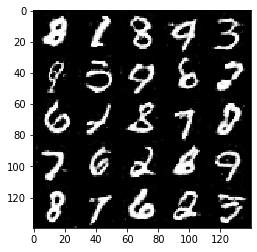

Epoch 5/20..., step 7700 Discriminator Loss: 0.5502... Generator Loss: 1.8677


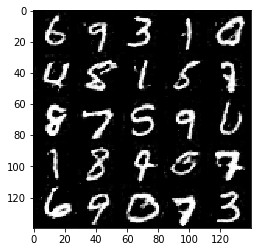

Epoch 5/20..., step 7800 Discriminator Loss: 0.5307... Generator Loss: 1.9174


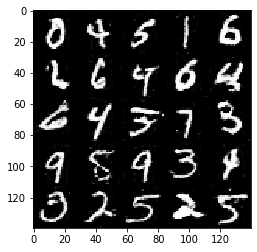

Epoch 5/20..., step 7900 Discriminator Loss: 0.5234... Generator Loss: 2.1279


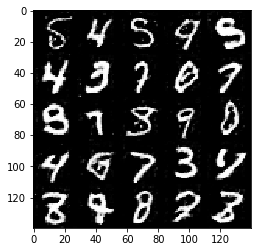

Epoch 5/20..., step 8000 Discriminator Loss: 0.4777... Generator Loss: 2.2649


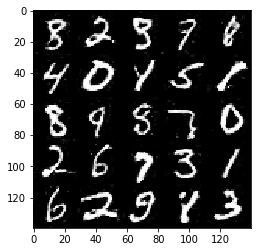

Epoch 5/20..., step 8100 Discriminator Loss: 0.5172... Generator Loss: 2.2236


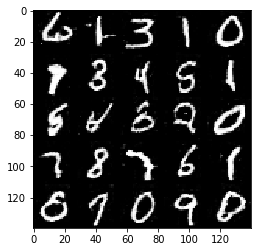

Epoch 5/20..., step 8200 Discriminator Loss: 0.5213... Generator Loss: 2.1350


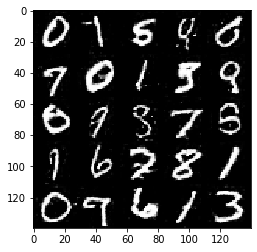

Epoch 5/20..., step 8300 Discriminator Loss: 0.5263... Generator Loss: 1.9937


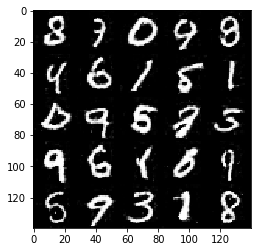

Epoch 5/20..., step 8400 Discriminator Loss: 0.4255... Generator Loss: 2.7757


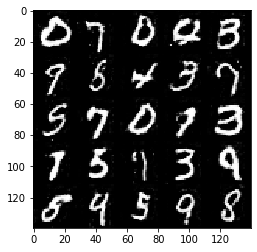

Epoch 5/20..., step 8500 Discriminator Loss: 0.5042... Generator Loss: 2.1935


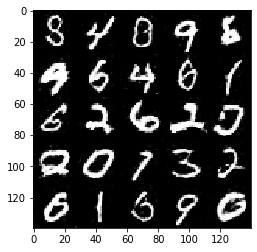

Epoch 5/20..., step 8600 Discriminator Loss: 0.9703... Generator Loss: 0.9104


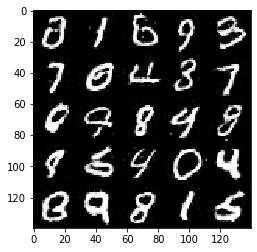

Epoch 5/20..., step 8700 Discriminator Loss: 0.5753... Generator Loss: 1.9435


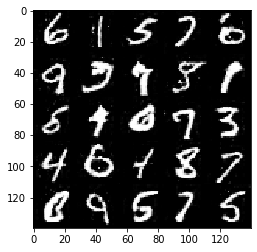

Epoch 5/20..., step 8800 Discriminator Loss: 0.5573... Generator Loss: 1.9343


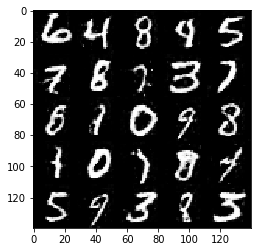

Epoch 5/20..., step 8900 Discriminator Loss: 0.9143... Generator Loss: 1.0671


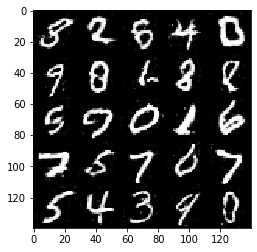

Epoch 5/20..., step 9000 Discriminator Loss: 0.5153... Generator Loss: 2.2337


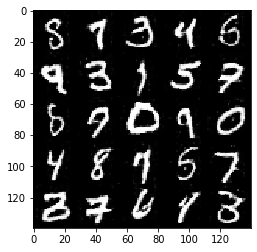

Epoch 5/20..., step 9100 Discriminator Loss: 0.4678... Generator Loss: 2.3831


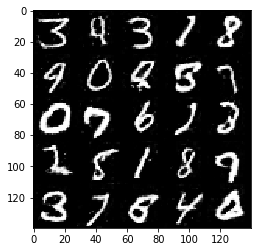

Epoch 5/20..., step 9200 Discriminator Loss: 0.5841... Generator Loss: 1.8827


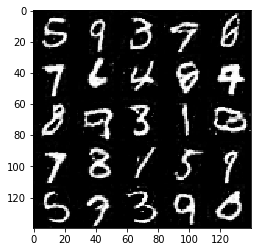

Epoch 5/20..., step 9300 Discriminator Loss: 0.5036... Generator Loss: 2.0921


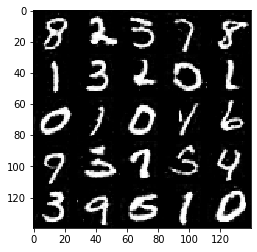

Epoch 6/20..., step 9400 Discriminator Loss: 0.4463... Generator Loss: 2.4873


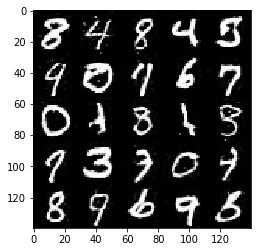

Epoch 6/20..., step 9500 Discriminator Loss: 0.4687... Generator Loss: 2.2567


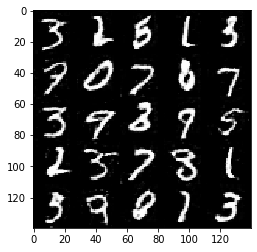

Epoch 6/20..., step 9600 Discriminator Loss: 0.6066... Generator Loss: 2.3351


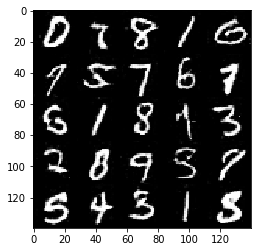

Epoch 6/20..., step 9700 Discriminator Loss: 0.4484... Generator Loss: 2.5344


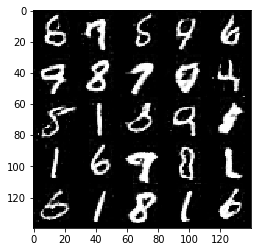

Epoch 6/20..., step 9800 Discriminator Loss: 0.4666... Generator Loss: 2.5395


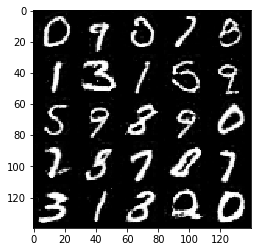

Epoch 6/20..., step 9900 Discriminator Loss: 0.4602... Generator Loss: 2.4415


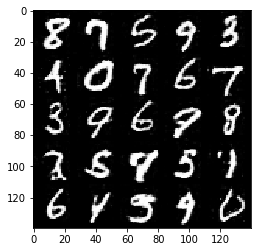

Epoch 6/20..., step 10000 Discriminator Loss: 0.3949... Generator Loss: 3.3584


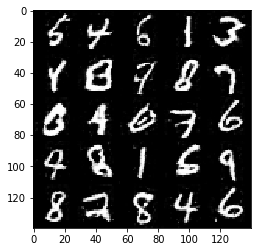

Epoch 6/20..., step 10100 Discriminator Loss: 0.5186... Generator Loss: 1.9533


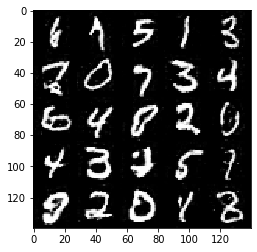

Epoch 6/20..., step 10200 Discriminator Loss: 0.4327... Generator Loss: 2.7867


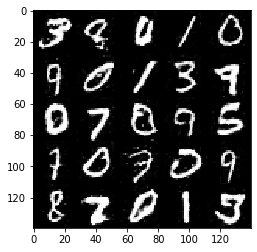

Epoch 6/20..., step 10300 Discriminator Loss: 0.4330... Generator Loss: 2.7247


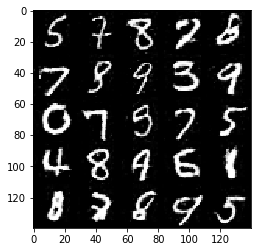

Epoch 6/20..., step 10400 Discriminator Loss: 0.6496... Generator Loss: 1.5513


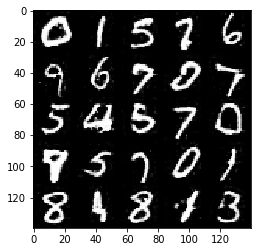

Epoch 6/20..., step 10500 Discriminator Loss: 0.5734... Generator Loss: 1.8430


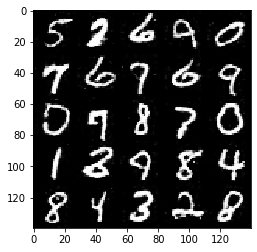

Epoch 6/20..., step 10600 Discriminator Loss: 0.5669... Generator Loss: 1.7998


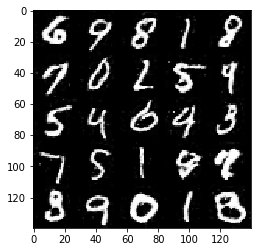

Epoch 6/20..., step 10700 Discriminator Loss: 0.4435... Generator Loss: 2.7455


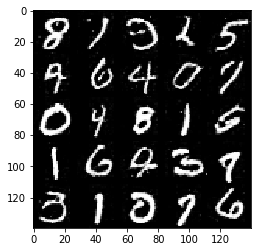

Epoch 6/20..., step 10800 Discriminator Loss: 0.8574... Generator Loss: 1.1735


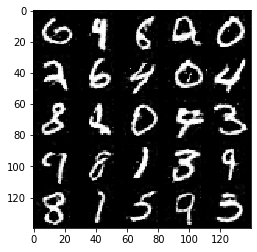

Epoch 6/20..., step 10900 Discriminator Loss: 0.4851... Generator Loss: 2.3592


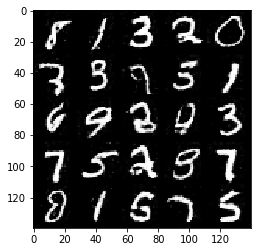

Epoch 6/20..., step 11000 Discriminator Loss: 0.5067... Generator Loss: 2.0942


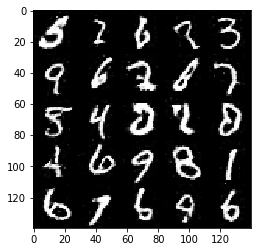

Epoch 6/20..., step 11100 Discriminator Loss: 0.4079... Generator Loss: 3.1722


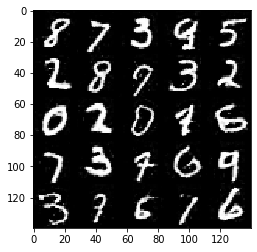

Epoch 6/20..., step 11200 Discriminator Loss: 0.6777... Generator Loss: 1.4391


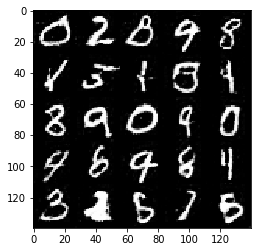

Epoch 7/20..., step 11300 Discriminator Loss: 0.6041... Generator Loss: 1.6660


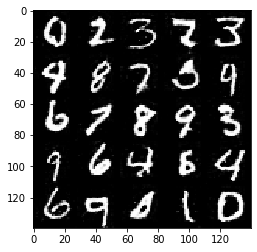

Epoch 7/20..., step 11400 Discriminator Loss: 0.5730... Generator Loss: 1.7626


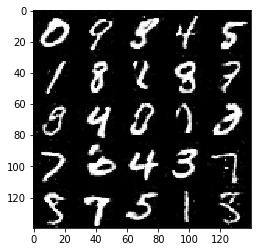

Epoch 7/20..., step 11500 Discriminator Loss: 0.5377... Generator Loss: 1.9811


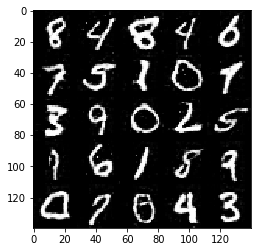

Epoch 7/20..., step 11600 Discriminator Loss: 0.4882... Generator Loss: 2.2396


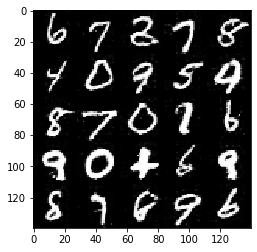

Epoch 7/20..., step 11700 Discriminator Loss: 0.5482... Generator Loss: 1.8741


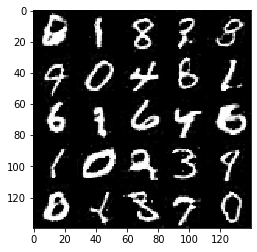

Epoch 7/20..., step 11800 Discriminator Loss: 0.6377... Generator Loss: 1.6311


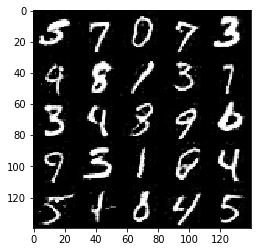

Epoch 7/20..., step 11900 Discriminator Loss: 0.5627... Generator Loss: 1.8362


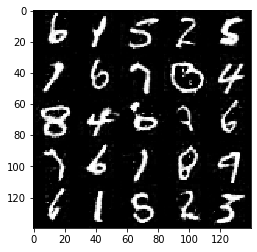

Epoch 7/20..., step 12000 Discriminator Loss: 0.4898... Generator Loss: 2.1821


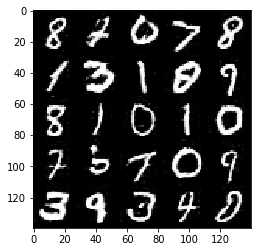

Epoch 7/20..., step 12100 Discriminator Loss: 0.5596... Generator Loss: 1.8181


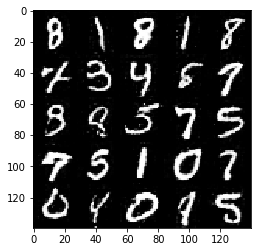

Epoch 7/20..., step 12200 Discriminator Loss: 0.5288... Generator Loss: 2.1569


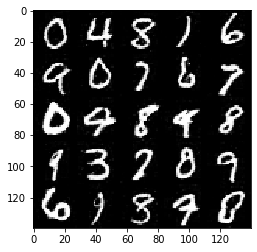

Epoch 7/20..., step 12300 Discriminator Loss: 0.4564... Generator Loss: 2.6614


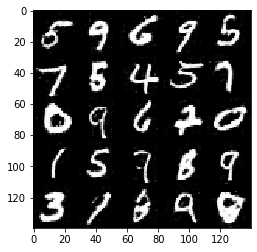

Epoch 7/20..., step 12400 Discriminator Loss: 0.6486... Generator Loss: 1.4694


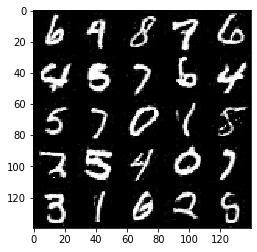

Epoch 7/20..., step 12500 Discriminator Loss: 0.5042... Generator Loss: 2.1049


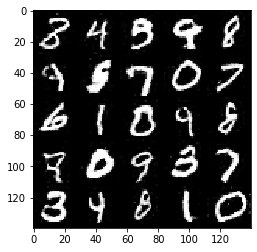

Epoch 7/20..., step 12600 Discriminator Loss: 0.4961... Generator Loss: 2.0897


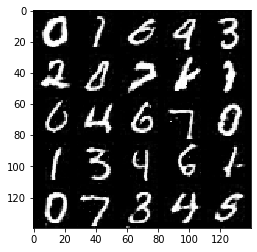

Epoch 7/20..., step 12700 Discriminator Loss: 0.5445... Generator Loss: 1.8563


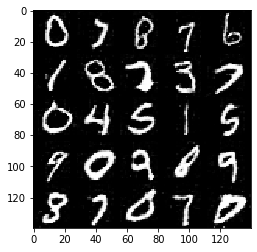

Epoch 7/20..., step 12800 Discriminator Loss: 0.5413... Generator Loss: 1.9097


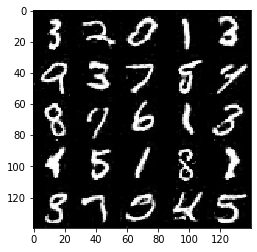

Epoch 7/20..., step 12900 Discriminator Loss: 1.1812... Generator Loss: 0.8095


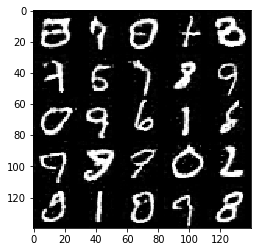

Epoch 7/20..., step 13000 Discriminator Loss: 0.5243... Generator Loss: 2.0682


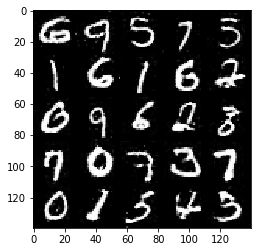

Epoch 7/20..., step 13100 Discriminator Loss: 0.7314... Generator Loss: 1.2686


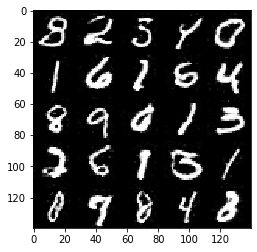

Epoch 8/20..., step 13200 Discriminator Loss: 0.7248... Generator Loss: 1.4099


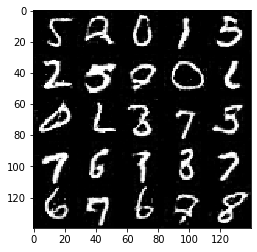

Epoch 8/20..., step 13300 Discriminator Loss: 0.5103... Generator Loss: 2.1458


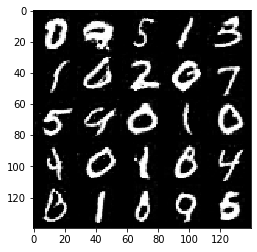

Epoch 8/20..., step 13400 Discriminator Loss: 0.6046... Generator Loss: 1.6981


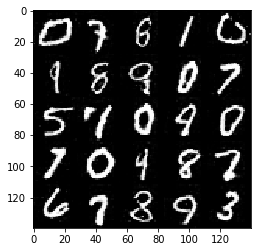

Epoch 8/20..., step 13500 Discriminator Loss: 1.0186... Generator Loss: 1.1208


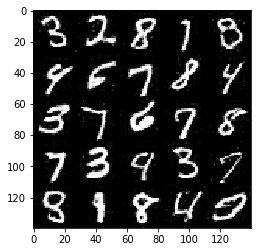

Epoch 8/20..., step 13600 Discriminator Loss: 0.6072... Generator Loss: 1.8076


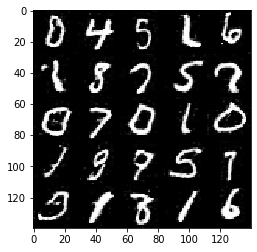

Epoch 8/20..., step 13700 Discriminator Loss: 0.5366... Generator Loss: 2.0450


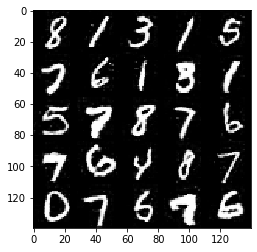

Epoch 8/20..., step 13800 Discriminator Loss: 0.4502... Generator Loss: 2.6128


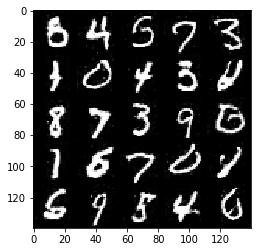

Epoch 8/20..., step 13900 Discriminator Loss: 0.7685... Generator Loss: 1.3754


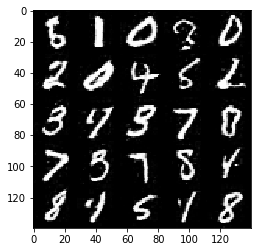

Epoch 8/20..., step 14000 Discriminator Loss: 0.4932... Generator Loss: 2.2047


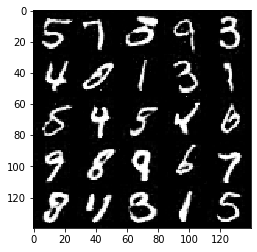

Epoch 8/20..., step 14100 Discriminator Loss: 0.5536... Generator Loss: 1.9081


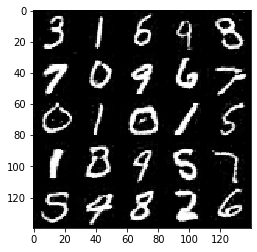

Epoch 8/20..., step 14200 Discriminator Loss: 0.4158... Generator Loss: 2.7526


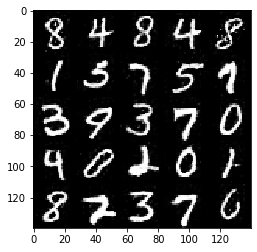

Epoch 8/20..., step 14300 Discriminator Loss: 0.4955... Generator Loss: 2.1647


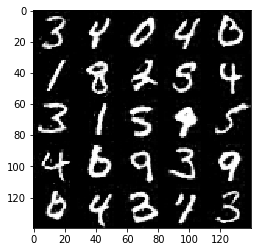

Epoch 8/20..., step 14400 Discriminator Loss: 0.5219... Generator Loss: 1.9352


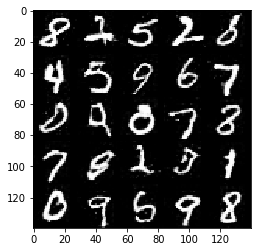

Epoch 8/20..., step 14500 Discriminator Loss: 0.6187... Generator Loss: 1.6078


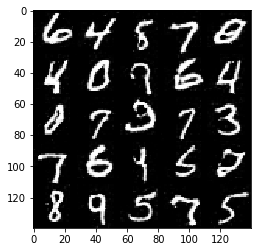

Epoch 8/20..., step 14600 Discriminator Loss: 0.5065... Generator Loss: 2.0638


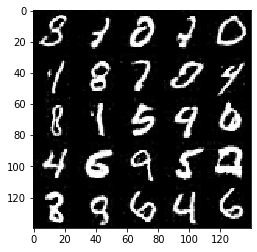

Epoch 8/20..., step 14700 Discriminator Loss: 0.4297... Generator Loss: 2.7153


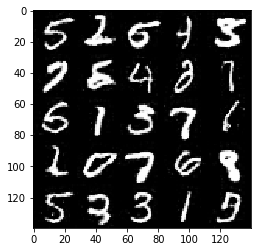

Epoch 8/20..., step 14800 Discriminator Loss: 0.4783... Generator Loss: 2.2626


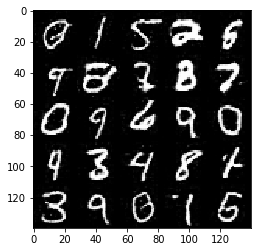

Epoch 8/20..., step 14900 Discriminator Loss: 0.5007... Generator Loss: 2.0825


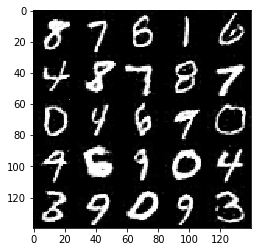

Epoch 8/20..., step 15000 Discriminator Loss: 0.5600... Generator Loss: 2.0480


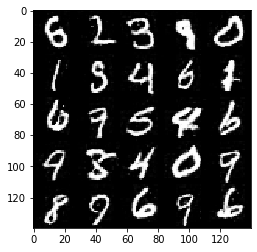

Epoch 9/20..., step 15100 Discriminator Loss: 0.6660... Generator Loss: 1.5443


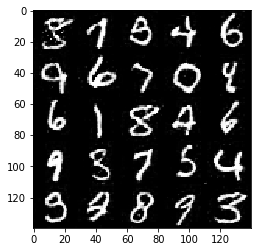

Epoch 9/20..., step 15200 Discriminator Loss: 0.5191... Generator Loss: 2.0721


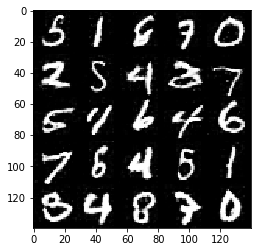

Epoch 9/20..., step 15300 Discriminator Loss: 0.4581... Generator Loss: 2.4731


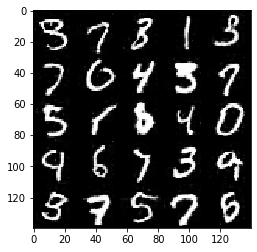

Epoch 9/20..., step 15400 Discriminator Loss: 0.4210... Generator Loss: 3.0538


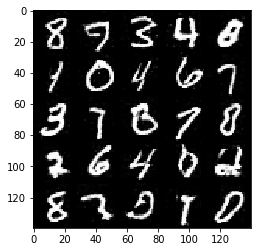

Epoch 9/20..., step 15500 Discriminator Loss: 0.5377... Generator Loss: 1.8720


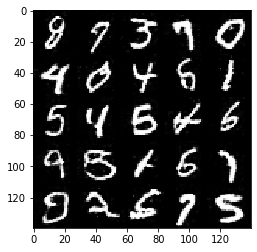

Epoch 9/20..., step 15600 Discriminator Loss: 0.5116... Generator Loss: 2.1927


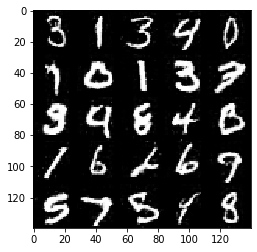

Epoch 9/20..., step 15700 Discriminator Loss: 0.5818... Generator Loss: 1.7708


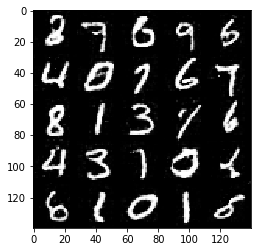

Epoch 9/20..., step 15800 Discriminator Loss: 0.4891... Generator Loss: 2.2438


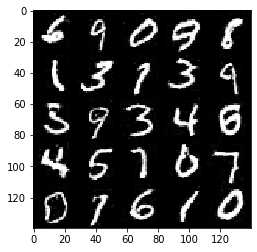

Epoch 9/20..., step 15900 Discriminator Loss: 0.5260... Generator Loss: 2.0382


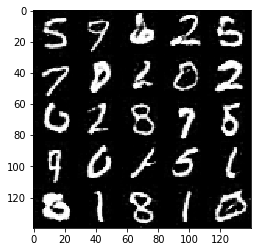

Epoch 9/20..., step 16000 Discriminator Loss: 0.8566... Generator Loss: 1.3107


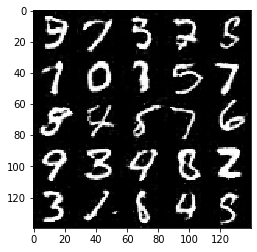

Epoch 9/20..., step 16100 Discriminator Loss: 1.3826... Generator Loss: 0.6277


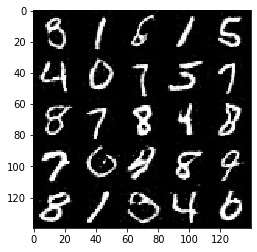

Epoch 9/20..., step 16200 Discriminator Loss: 0.5550... Generator Loss: 1.9205


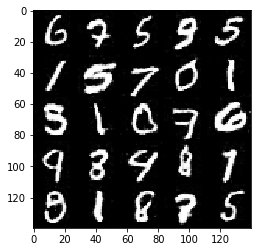

Epoch 9/20..., step 16300 Discriminator Loss: 0.4985... Generator Loss: 2.1294


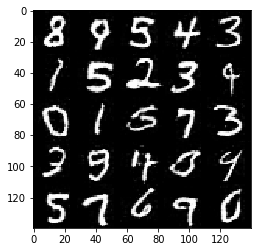

Epoch 9/20..., step 16400 Discriminator Loss: 0.5978... Generator Loss: 1.7530


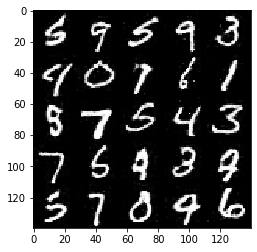

Epoch 9/20..., step 16500 Discriminator Loss: 0.5817... Generator Loss: 1.7159


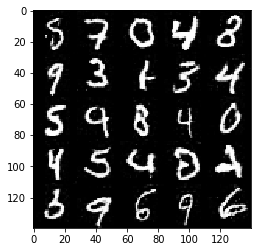

Epoch 9/20..., step 16600 Discriminator Loss: 0.4120... Generator Loss: 3.1128


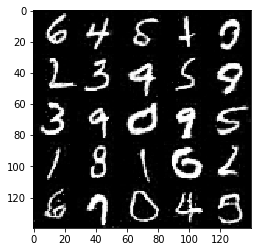

Epoch 9/20..., step 16700 Discriminator Loss: 0.4577... Generator Loss: 2.3624


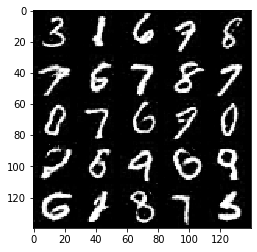

Epoch 9/20..., step 16800 Discriminator Loss: 0.5034... Generator Loss: 2.0551


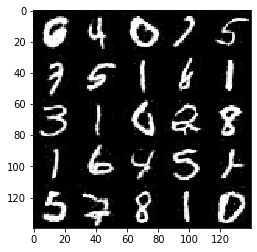

Epoch 10/20..., step 16900 Discriminator Loss: 0.5074... Generator Loss: 2.2909


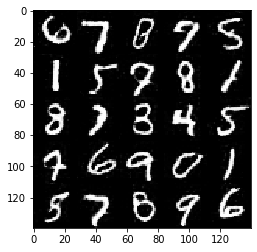

Epoch 10/20..., step 17000 Discriminator Loss: 0.6465... Generator Loss: 1.4977


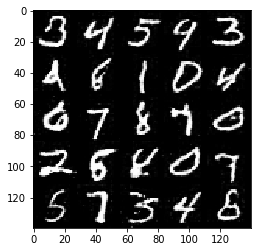

Epoch 10/20..., step 17100 Discriminator Loss: 0.5521... Generator Loss: 1.9506


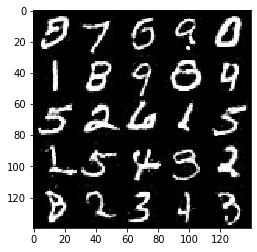

Epoch 10/20..., step 17200 Discriminator Loss: 0.4444... Generator Loss: 2.4991


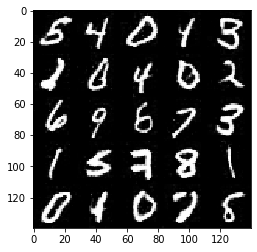

Epoch 10/20..., step 17300 Discriminator Loss: 0.6275... Generator Loss: 1.6409


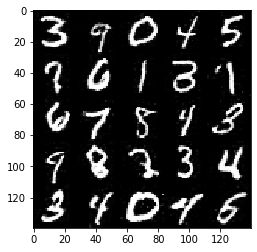

Epoch 10/20..., step 17400 Discriminator Loss: 0.5393... Generator Loss: 1.8979


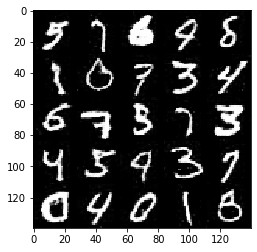

Epoch 10/20..., step 17500 Discriminator Loss: 0.4130... Generator Loss: 3.0840


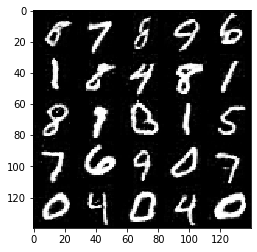

Epoch 10/20..., step 17600 Discriminator Loss: 0.4588... Generator Loss: 2.4957


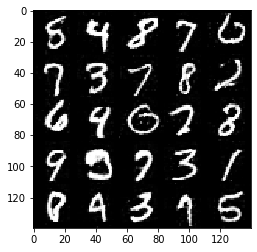

Epoch 10/20..., step 17700 Discriminator Loss: 0.5029... Generator Loss: 2.1989


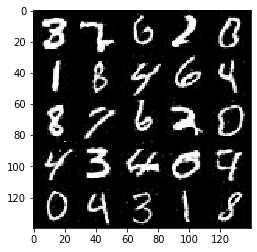

Epoch 10/20..., step 17800 Discriminator Loss: 0.4101... Generator Loss: 3.4820


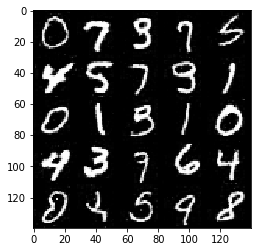

Epoch 10/20..., step 17900 Discriminator Loss: 0.6928... Generator Loss: 1.4834


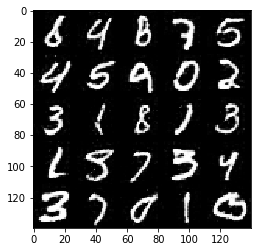

Epoch 10/20..., step 18000 Discriminator Loss: 0.6003... Generator Loss: 1.7979


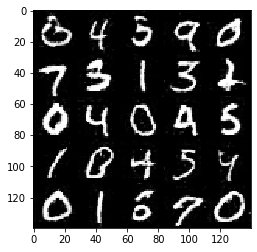

Epoch 10/20..., step 18100 Discriminator Loss: 0.4042... Generator Loss: 2.9774


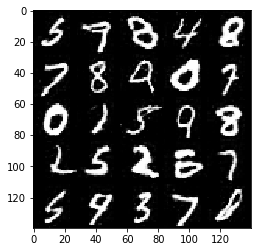

Epoch 10/20..., step 18200 Discriminator Loss: 0.5761... Generator Loss: 1.7623


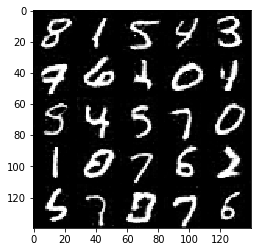

Epoch 10/20..., step 18300 Discriminator Loss: 0.6311... Generator Loss: 1.5661


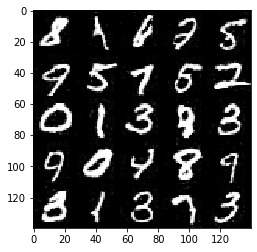

Epoch 10/20..., step 18400 Discriminator Loss: 0.5885... Generator Loss: 1.7766


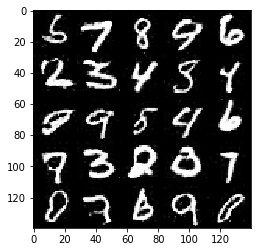

Epoch 10/20..., step 18500 Discriminator Loss: 0.6218... Generator Loss: 1.5782


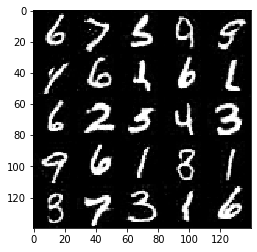

Epoch 10/20..., step 18600 Discriminator Loss: 0.4481... Generator Loss: 2.5778


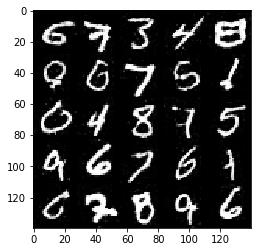

Epoch 10/20..., step 18700 Discriminator Loss: 0.6663... Generator Loss: 1.5269


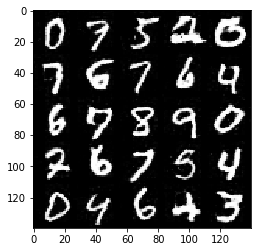

Epoch 11/20..., step 18800 Discriminator Loss: 0.5303... Generator Loss: 1.9817


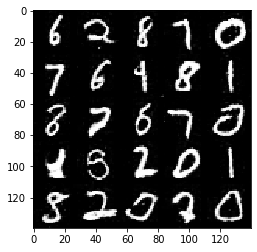

Epoch 11/20..., step 18900 Discriminator Loss: 0.6607... Generator Loss: 1.5126


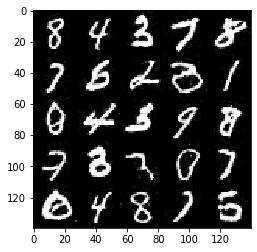

Epoch 11/20..., step 19000 Discriminator Loss: 0.6566... Generator Loss: 1.4424


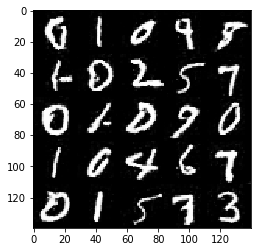

Epoch 11/20..., step 19100 Discriminator Loss: 0.5548... Generator Loss: 1.8801


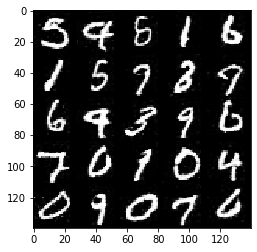

Epoch 11/20..., step 19200 Discriminator Loss: 0.5005... Generator Loss: 2.1811


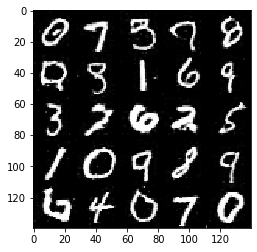

Epoch 11/20..., step 19300 Discriminator Loss: 0.5531... Generator Loss: 2.0235


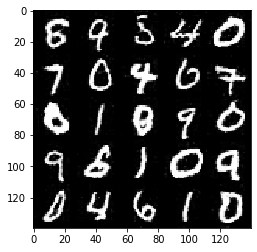

Epoch 11/20..., step 19400 Discriminator Loss: 0.7254... Generator Loss: 1.3591


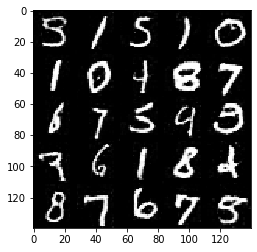

Epoch 11/20..., step 19500 Discriminator Loss: 0.5008... Generator Loss: 2.1326


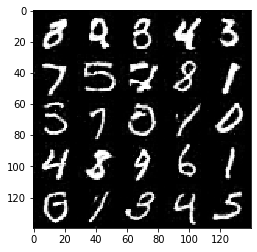

Epoch 11/20..., step 19600 Discriminator Loss: 0.6256... Generator Loss: 1.7036


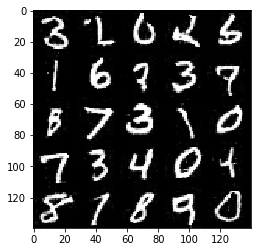

Epoch 11/20..., step 19700 Discriminator Loss: 0.5301... Generator Loss: 2.0260


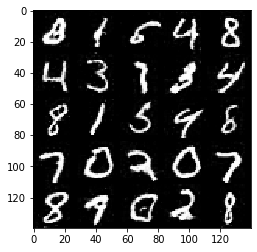

Epoch 11/20..., step 19800 Discriminator Loss: 0.5886... Generator Loss: 1.7010


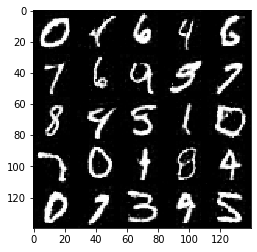

Epoch 11/20..., step 19900 Discriminator Loss: 0.6524... Generator Loss: 1.5359


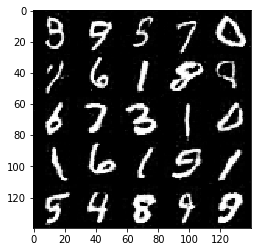

Epoch 11/20..., step 20000 Discriminator Loss: 0.5699... Generator Loss: 1.9546


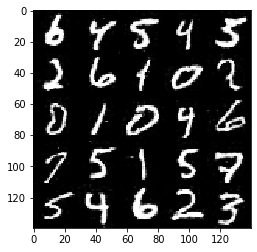

Epoch 11/20..., step 20100 Discriminator Loss: 0.8077... Generator Loss: 1.3951


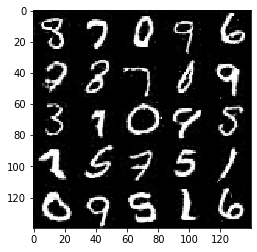

Epoch 11/20..., step 20200 Discriminator Loss: 0.4404... Generator Loss: 2.5381


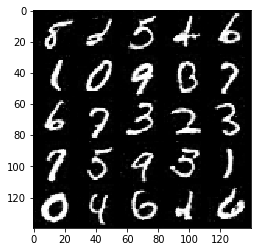

Epoch 11/20..., step 20300 Discriminator Loss: 0.5430... Generator Loss: 1.9232


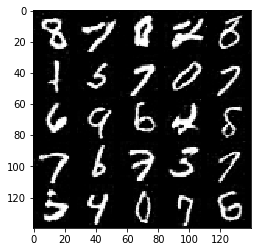

Epoch 11/20..., step 20400 Discriminator Loss: 0.6317... Generator Loss: 1.6290


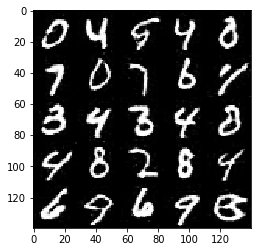

Epoch 11/20..., step 20500 Discriminator Loss: 0.5713... Generator Loss: 1.8491


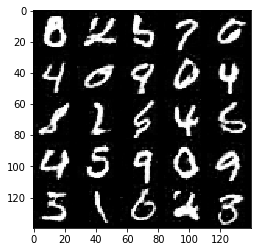

Epoch 11/20..., step 20600 Discriminator Loss: 0.5064... Generator Loss: 2.1741


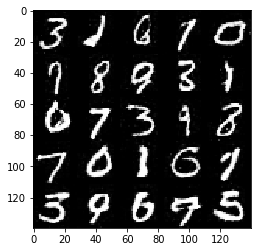

Epoch 12/20..., step 20700 Discriminator Loss: 0.7627... Generator Loss: 4.9689


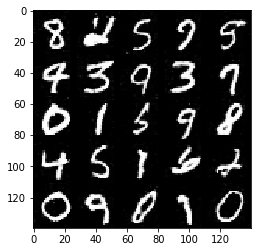

Epoch 12/20..., step 20800 Discriminator Loss: 0.5269... Generator Loss: 3.1149


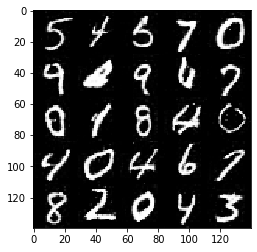

Epoch 12/20..., step 20900 Discriminator Loss: 0.5723... Generator Loss: 1.8173


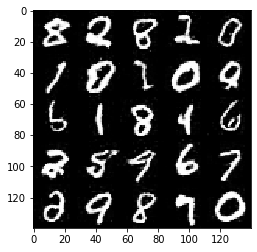

Epoch 12/20..., step 21000 Discriminator Loss: 0.5601... Generator Loss: 1.8997


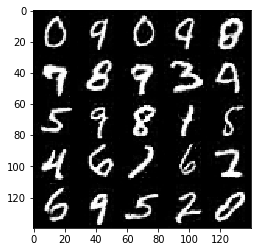

Epoch 12/20..., step 21100 Discriminator Loss: 0.4578... Generator Loss: 2.5466


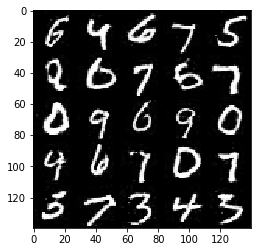

Epoch 12/20..., step 21200 Discriminator Loss: 0.3971... Generator Loss: 3.1103


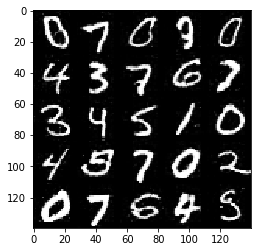

Epoch 12/20..., step 21300 Discriminator Loss: 0.4886... Generator Loss: 2.1881


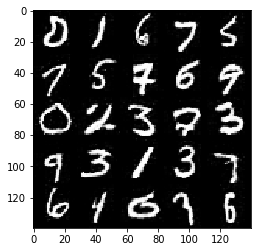

Epoch 12/20..., step 21400 Discriminator Loss: 0.5433... Generator Loss: 1.9513


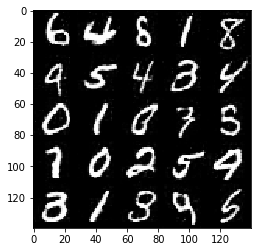

Epoch 12/20..., step 21500 Discriminator Loss: 0.4607... Generator Loss: 2.4949


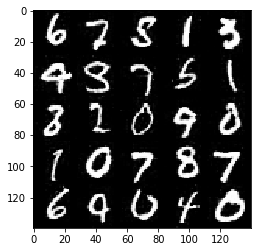

Epoch 12/20..., step 21600 Discriminator Loss: 0.6077... Generator Loss: 1.8760


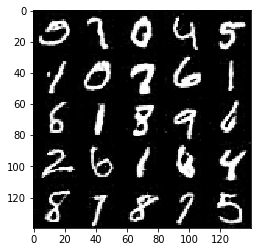

Epoch 12/20..., step 21700 Discriminator Loss: 0.7119... Generator Loss: 3.9966


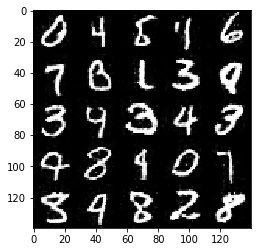

Epoch 12/20..., step 21800 Discriminator Loss: 0.5691... Generator Loss: 1.7548


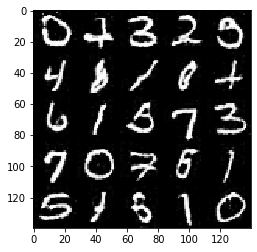

Epoch 12/20..., step 21900 Discriminator Loss: 0.4630... Generator Loss: 2.3893


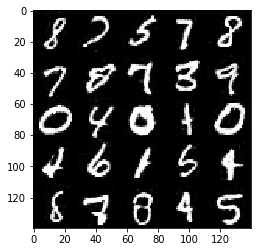

Epoch 12/20..., step 22000 Discriminator Loss: 0.6541... Generator Loss: 1.7062


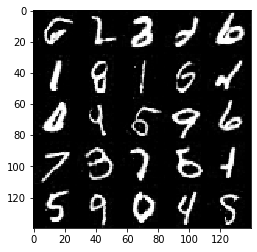

Epoch 12/20..., step 22100 Discriminator Loss: 0.6901... Generator Loss: 1.7484


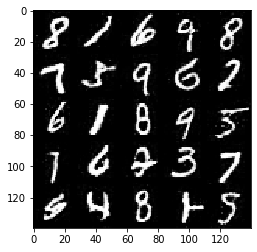

Epoch 12/20..., step 22200 Discriminator Loss: 0.4782... Generator Loss: 2.3265


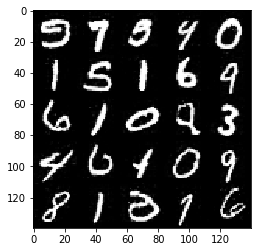

Epoch 12/20..., step 22300 Discriminator Loss: 0.3749... Generator Loss: 3.6177


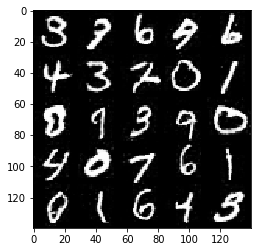

Epoch 12/20..., step 22400 Discriminator Loss: 0.5869... Generator Loss: 1.7840


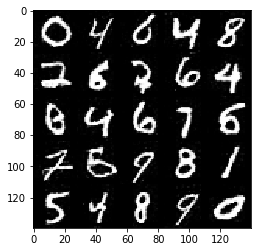

Epoch 12/20..., step 22500 Discriminator Loss: 1.6236... Generator Loss: 0.8288


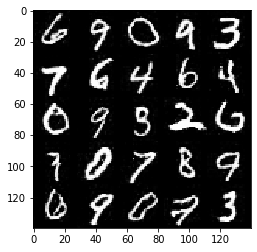

Epoch 13/20..., step 22600 Discriminator Loss: 0.5310... Generator Loss: 1.9861


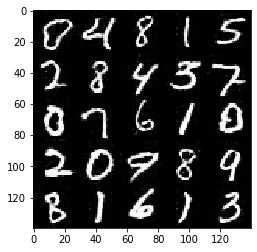

Epoch 13/20..., step 22700 Discriminator Loss: 0.8273... Generator Loss: 1.2229


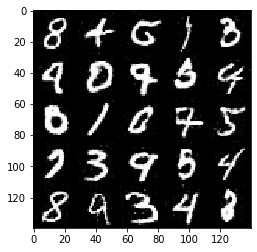

Epoch 13/20..., step 22800 Discriminator Loss: 0.6893... Generator Loss: 1.5084


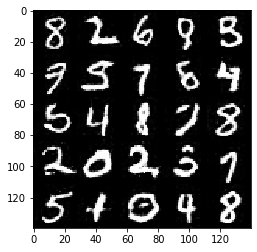

Epoch 13/20..., step 22900 Discriminator Loss: 0.4989... Generator Loss: 2.3326


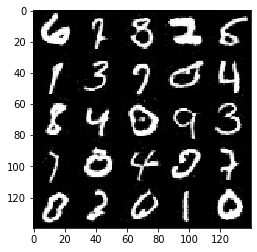

Epoch 13/20..., step 23000 Discriminator Loss: 0.5050... Generator Loss: 2.1706


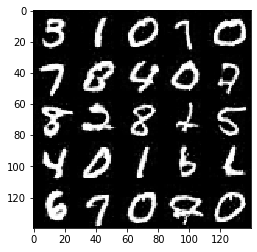

Epoch 13/20..., step 23100 Discriminator Loss: 0.4501... Generator Loss: 2.4887


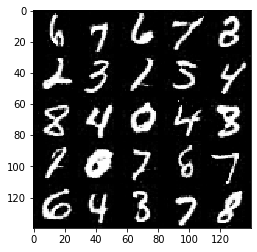

Epoch 13/20..., step 23200 Discriminator Loss: 1.0839... Generator Loss: 1.0061


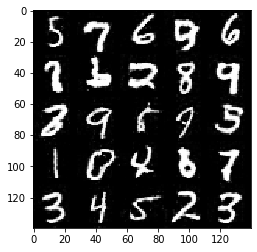

Epoch 13/20..., step 23300 Discriminator Loss: 0.8103... Generator Loss: 1.1362


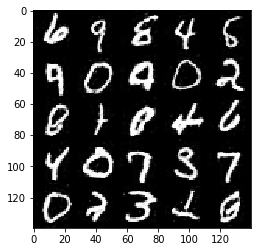

Epoch 13/20..., step 23400 Discriminator Loss: 0.4882... Generator Loss: 2.1971


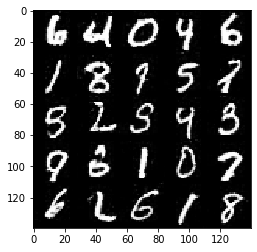

Epoch 13/20..., step 23500 Discriminator Loss: 0.4144... Generator Loss: 2.9408


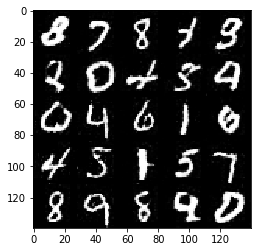

Epoch 13/20..., step 23600 Discriminator Loss: 1.1721... Generator Loss: 0.8441


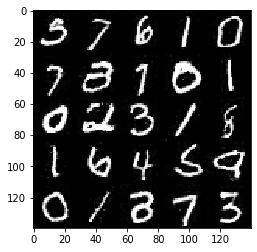

Epoch 13/20..., step 23700 Discriminator Loss: 0.7050... Generator Loss: 1.3193


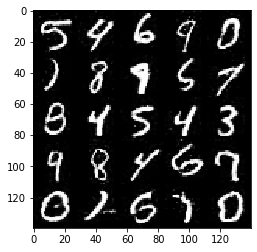

Epoch 13/20..., step 23800 Discriminator Loss: 0.8716... Generator Loss: 1.2410


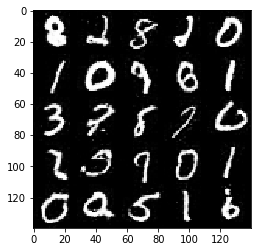

Epoch 13/20..., step 23900 Discriminator Loss: 0.7000... Generator Loss: 1.4223


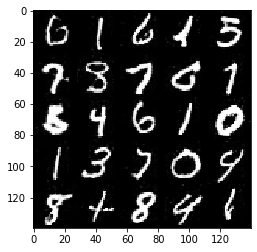

Epoch 13/20..., step 24000 Discriminator Loss: 0.6116... Generator Loss: 1.7053


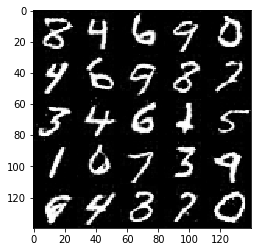

Epoch 13/20..., step 24100 Discriminator Loss: 0.4945... Generator Loss: 2.2708


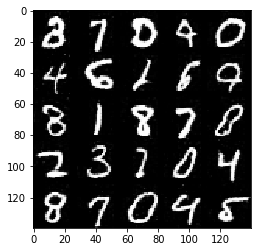

Epoch 13/20..., step 24200 Discriminator Loss: 0.5077... Generator Loss: 2.2322


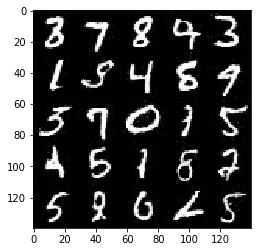

Epoch 13/20..., step 24300 Discriminator Loss: 0.4541... Generator Loss: 2.7028


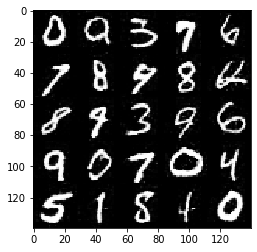

Epoch 14/20..., step 24400 Discriminator Loss: 0.5799... Generator Loss: 2.0199


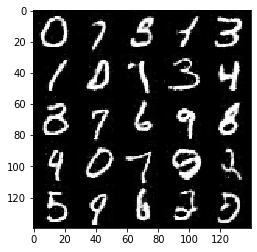

Epoch 14/20..., step 24500 Discriminator Loss: 0.4825... Generator Loss: 2.3324


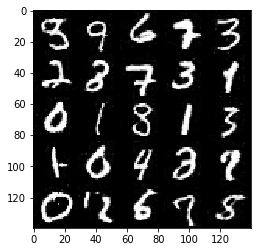

Epoch 14/20..., step 24600 Discriminator Loss: 0.4408... Generator Loss: 2.7926


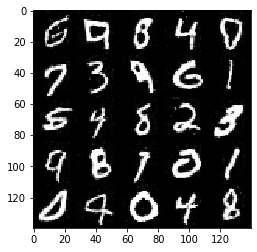

Epoch 14/20..., step 24700 Discriminator Loss: 0.4404... Generator Loss: 2.6142


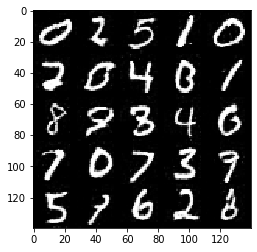

Epoch 14/20..., step 24800 Discriminator Loss: 0.5491... Generator Loss: 1.8466


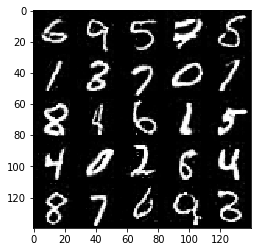

Epoch 14/20..., step 24900 Discriminator Loss: 1.2220... Generator Loss: 0.7087


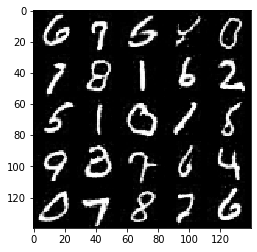

Epoch 14/20..., step 25000 Discriminator Loss: 0.4481... Generator Loss: 2.5825


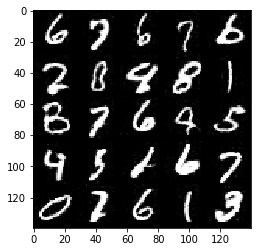

Epoch 14/20..., step 25100 Discriminator Loss: 1.4554... Generator Loss: 0.5527


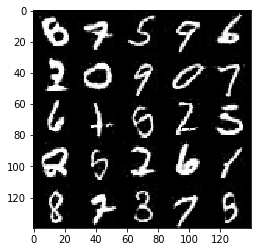

Epoch 14/20..., step 25200 Discriminator Loss: 0.6068... Generator Loss: 1.6792


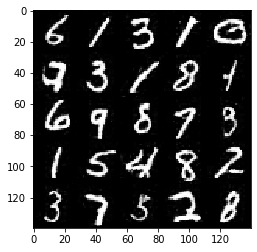

Epoch 14/20..., step 25300 Discriminator Loss: 0.4276... Generator Loss: 2.9996


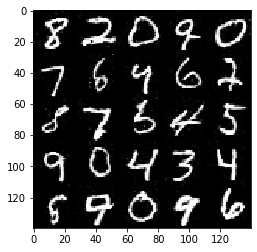

Epoch 14/20..., step 25400 Discriminator Loss: 0.7910... Generator Loss: 1.2300


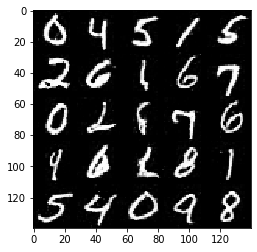

Epoch 14/20..., step 25500 Discriminator Loss: 0.5628... Generator Loss: 1.8490


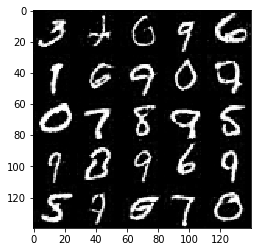

Epoch 14/20..., step 25600 Discriminator Loss: 0.4291... Generator Loss: 2.7051


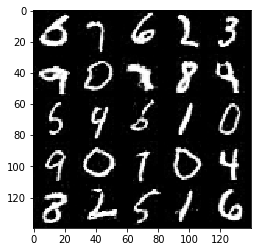

Epoch 14/20..., step 25700 Discriminator Loss: 0.5906... Generator Loss: 1.9072


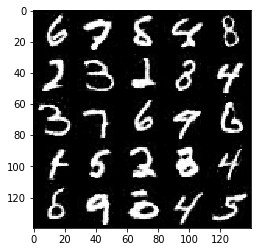

Epoch 14/20..., step 25800 Discriminator Loss: 0.6993... Generator Loss: 1.3690


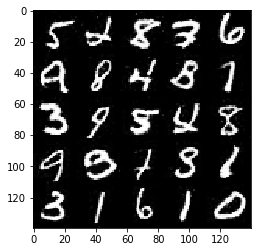

Epoch 14/20..., step 25900 Discriminator Loss: 0.6510... Generator Loss: 1.5308


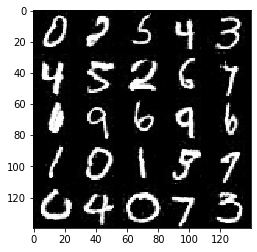

Epoch 14/20..., step 26000 Discriminator Loss: 0.5314... Generator Loss: 1.9947


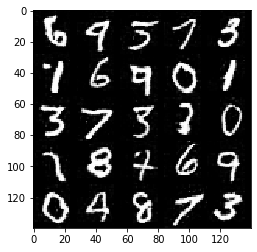

Epoch 14/20..., step 26100 Discriminator Loss: 0.5140... Generator Loss: 2.1273


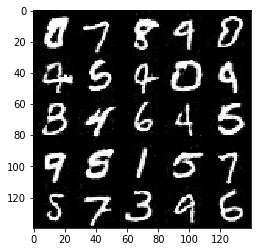

Epoch 14/20..., step 26200 Discriminator Loss: 0.5707... Generator Loss: 1.9428


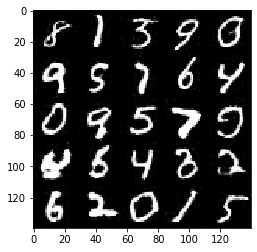

Epoch 15/20..., step 26300 Discriminator Loss: 0.6553... Generator Loss: 1.5485


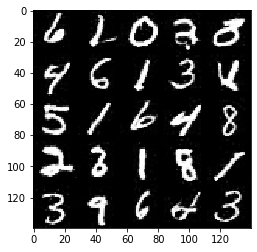

Epoch 15/20..., step 26400 Discriminator Loss: 0.6798... Generator Loss: 1.3967


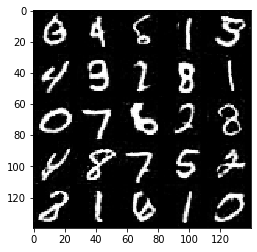

Epoch 15/20..., step 26500 Discriminator Loss: 0.6289... Generator Loss: 1.6252


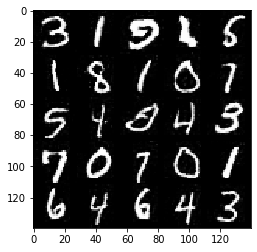

Epoch 15/20..., step 26600 Discriminator Loss: 0.7411... Generator Loss: 1.2804


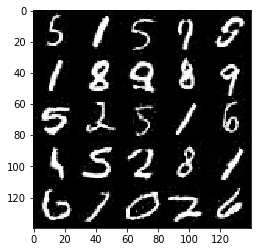

Epoch 15/20..., step 26700 Discriminator Loss: 0.5258... Generator Loss: 2.0984


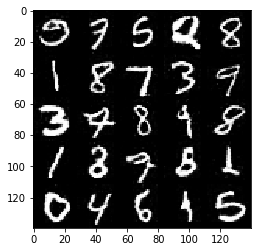

Epoch 15/20..., step 26800 Discriminator Loss: 0.8008... Generator Loss: 1.2560


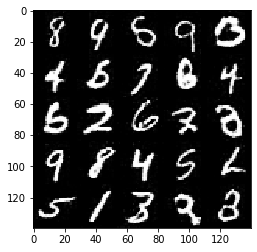

Epoch 15/20..., step 26900 Discriminator Loss: 0.5818... Generator Loss: 1.7723


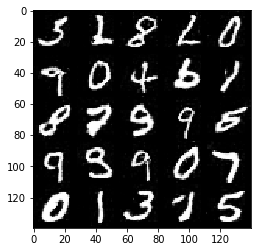

Epoch 15/20..., step 27000 Discriminator Loss: 0.4587... Generator Loss: 2.5265


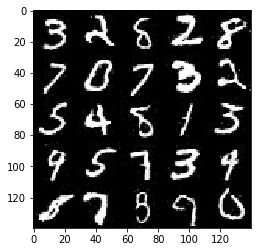

Epoch 15/20..., step 27100 Discriminator Loss: 0.5129... Generator Loss: 1.9913


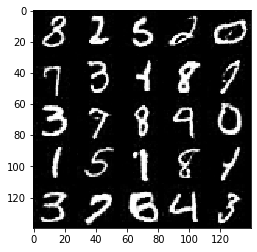

Epoch 15/20..., step 27200 Discriminator Loss: 0.4821... Generator Loss: 2.3667


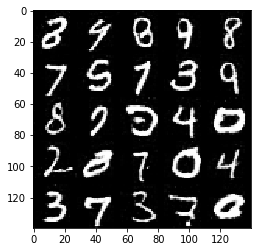

Epoch 15/20..., step 27300 Discriminator Loss: 0.7572... Generator Loss: 1.2901


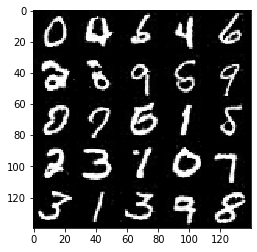

Epoch 15/20..., step 27400 Discriminator Loss: 0.6290... Generator Loss: 1.7853


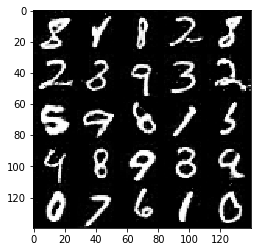

Epoch 15/20..., step 27500 Discriminator Loss: 0.5619... Generator Loss: 2.2099


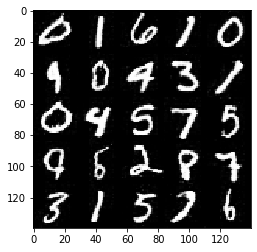

Epoch 15/20..., step 27600 Discriminator Loss: 0.5356... Generator Loss: 2.3970


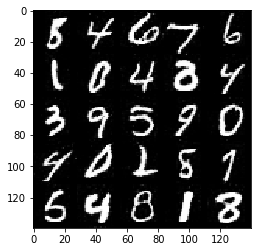

Epoch 15/20..., step 27700 Discriminator Loss: 0.5658... Generator Loss: 1.9254


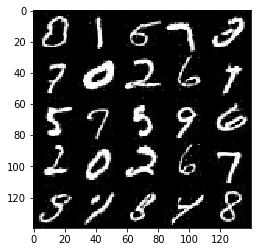

Epoch 15/20..., step 27800 Discriminator Loss: 0.4800... Generator Loss: 2.5654


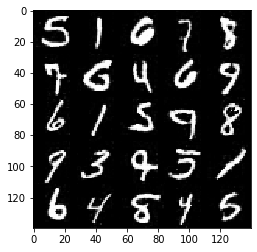

Epoch 15/20..., step 27900 Discriminator Loss: 0.6242... Generator Loss: 1.6700


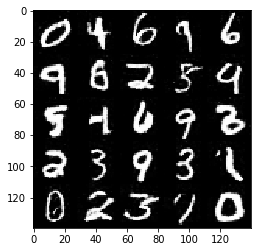

Epoch 15/20..., step 28000 Discriminator Loss: 1.2387... Generator Loss: 0.7917


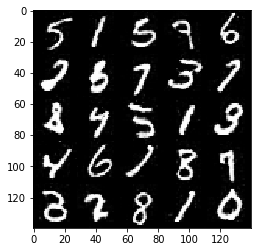

Epoch 15/20..., step 28100 Discriminator Loss: 0.7774... Generator Loss: 1.3187


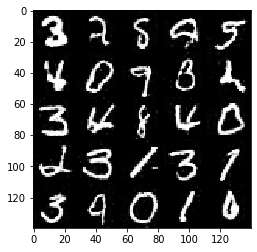

Epoch 16/20..., step 28200 Discriminator Loss: 0.4579... Generator Loss: 2.4842


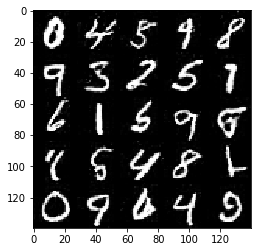

Epoch 16/20..., step 28300 Discriminator Loss: 0.7461... Generator Loss: 1.4795


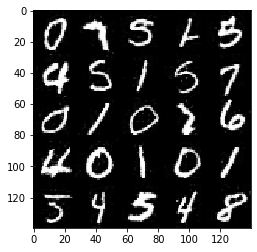

Epoch 16/20..., step 28400 Discriminator Loss: 0.6520... Generator Loss: 1.4596


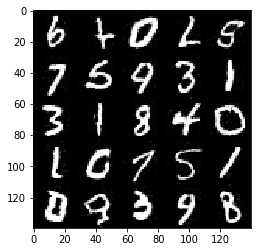

Epoch 16/20..., step 28500 Discriminator Loss: 0.4805... Generator Loss: 2.2434


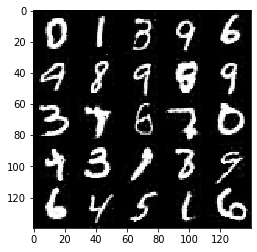

Epoch 16/20..., step 28600 Discriminator Loss: 0.5880... Generator Loss: 1.9080


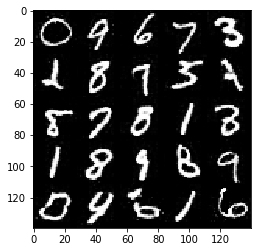

Epoch 16/20..., step 28700 Discriminator Loss: 0.4272... Generator Loss: 2.7530


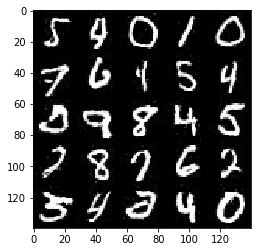

Epoch 16/20..., step 28800 Discriminator Loss: 0.9396... Generator Loss: 0.9657


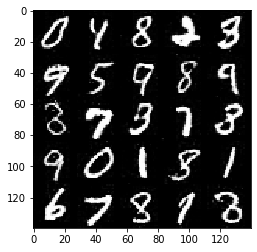

Epoch 16/20..., step 28900 Discriminator Loss: 0.5065... Generator Loss: 2.4050


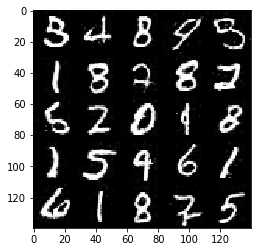

Epoch 16/20..., step 29000 Discriminator Loss: 0.4492... Generator Loss: 2.6509


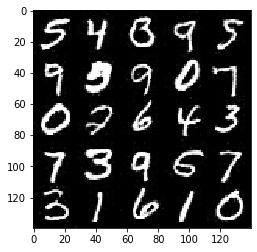

Epoch 16/20..., step 29100 Discriminator Loss: 0.6238... Generator Loss: 1.5829


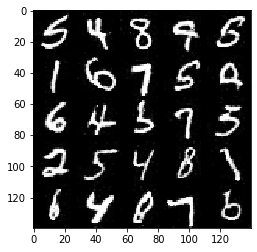

Epoch 16/20..., step 29200 Discriminator Loss: 0.6732... Generator Loss: 1.5556


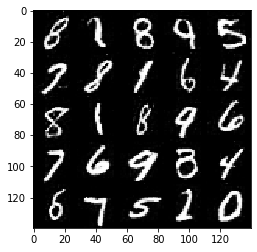

Epoch 16/20..., step 29300 Discriminator Loss: 0.5873... Generator Loss: 1.7554


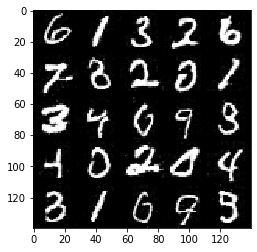

Epoch 16/20..., step 29400 Discriminator Loss: 0.6591... Generator Loss: 1.5036


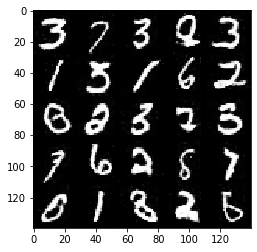

Epoch 16/20..., step 29500 Discriminator Loss: 0.6181... Generator Loss: 1.7718


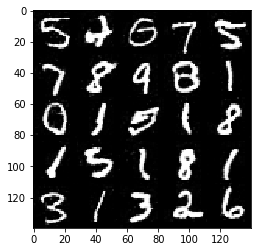

Epoch 16/20..., step 29600 Discriminator Loss: 0.6646... Generator Loss: 1.5719


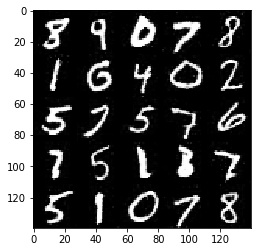

Epoch 16/20..., step 29700 Discriminator Loss: 0.9129... Generator Loss: 1.1942


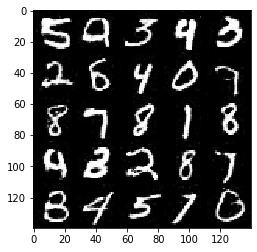

Epoch 16/20..., step 29800 Discriminator Loss: 0.5618... Generator Loss: 1.9730


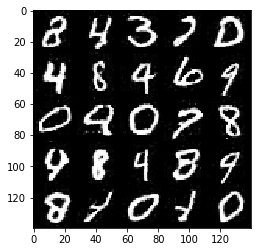

Epoch 16/20..., step 29900 Discriminator Loss: 0.6787... Generator Loss: 1.4410


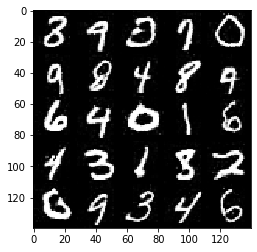

Epoch 16/20..., step 30000 Discriminator Loss: 0.7657... Generator Loss: 1.2678


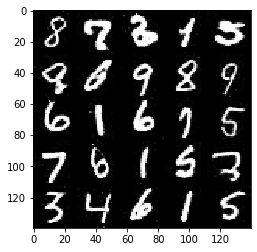

Epoch 17/20..., step 30100 Discriminator Loss: 0.4171... Generator Loss: 2.8054


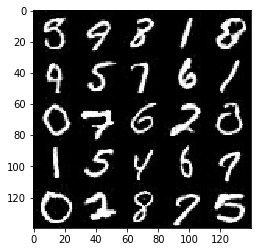

Epoch 17/20..., step 30200 Discriminator Loss: 0.6384... Generator Loss: 1.5725


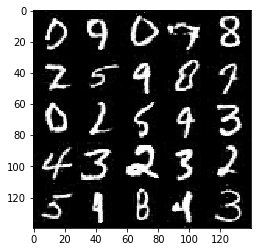

Epoch 17/20..., step 30300 Discriminator Loss: 0.5015... Generator Loss: 2.0969


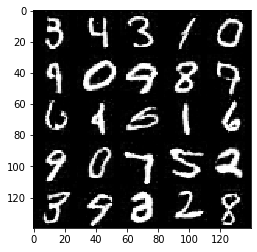

Epoch 17/20..., step 30400 Discriminator Loss: 0.6317... Generator Loss: 1.6073


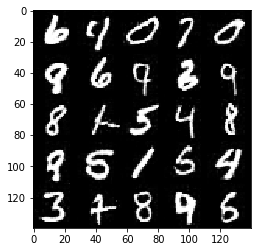

Epoch 17/20..., step 30500 Discriminator Loss: 0.5880... Generator Loss: 1.7394


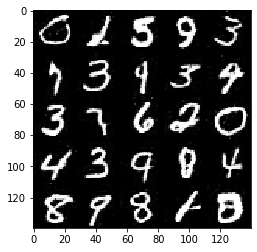

Epoch 17/20..., step 30600 Discriminator Loss: 0.4305... Generator Loss: 2.7075


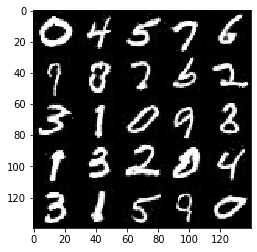

Epoch 17/20..., step 30700 Discriminator Loss: 0.5225... Generator Loss: 2.0901


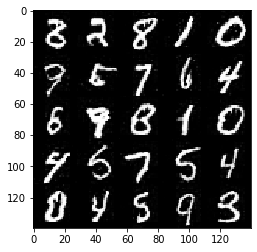

Epoch 17/20..., step 30800 Discriminator Loss: 0.5582... Generator Loss: 1.8979


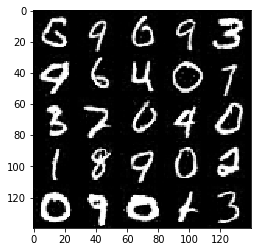

Epoch 17/20..., step 30900 Discriminator Loss: 0.4519... Generator Loss: 2.4307


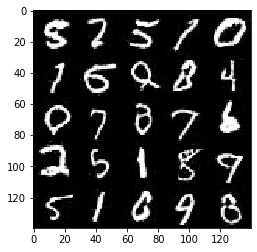

Epoch 17/20..., step 31000 Discriminator Loss: 0.4882... Generator Loss: 2.3110


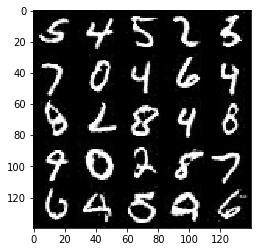

Epoch 17/20..., step 31100 Discriminator Loss: 1.1838... Generator Loss: 0.7743


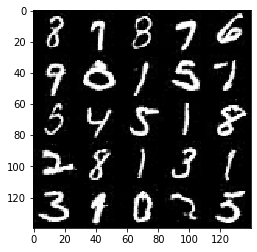

Epoch 17/20..., step 31200 Discriminator Loss: 0.6832... Generator Loss: 1.4940


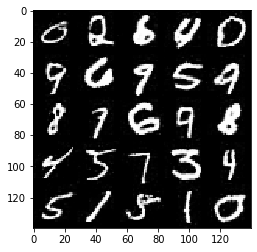

Epoch 17/20..., step 31300 Discriminator Loss: 0.4163... Generator Loss: 2.8875


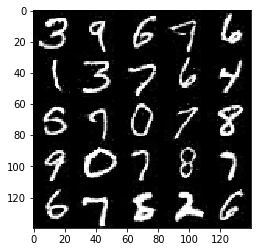

Epoch 17/20..., step 31400 Discriminator Loss: 0.5355... Generator Loss: 2.0570


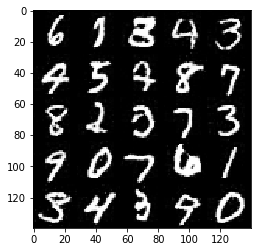

Epoch 17/20..., step 31500 Discriminator Loss: 0.4944... Generator Loss: 2.4308


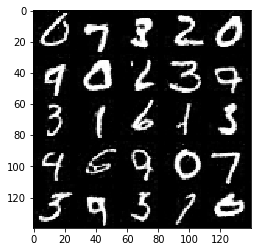

Epoch 17/20..., step 31600 Discriminator Loss: 0.4892... Generator Loss: 2.2606


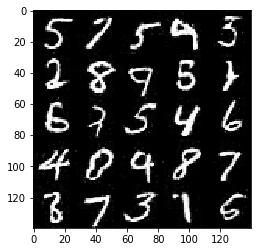

Epoch 17/20..., step 31700 Discriminator Loss: 0.4515... Generator Loss: 2.6961


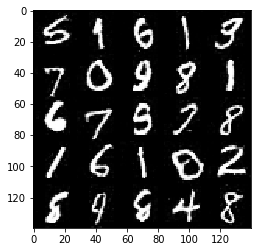

Epoch 17/20..., step 31800 Discriminator Loss: 0.4683... Generator Loss: 2.5313


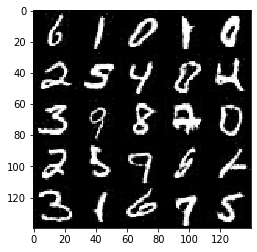

Epoch 18/20..., step 31900 Discriminator Loss: 0.7660... Generator Loss: 1.2498


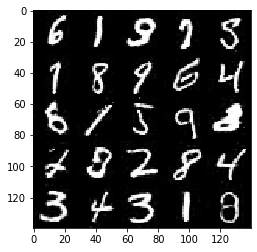

Epoch 18/20..., step 32000 Discriminator Loss: 0.6817... Generator Loss: 1.5272


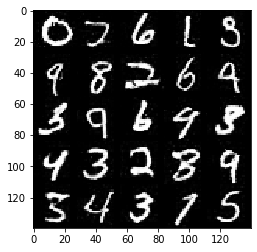

Epoch 18/20..., step 32100 Discriminator Loss: 0.4930... Generator Loss: 2.1294


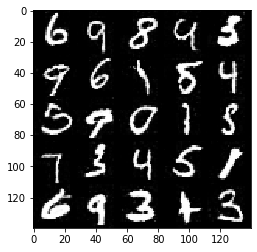

Epoch 18/20..., step 32200 Discriminator Loss: 0.4814... Generator Loss: 2.2042


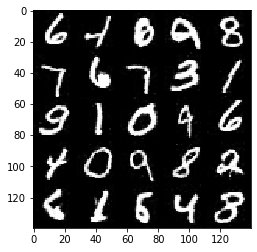

Epoch 18/20..., step 32300 Discriminator Loss: 0.5857... Generator Loss: 1.7895


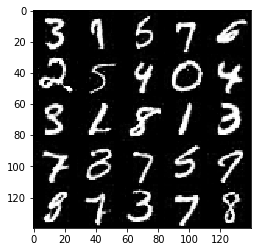

Epoch 18/20..., step 32400 Discriminator Loss: 0.5262... Generator Loss: 2.0168


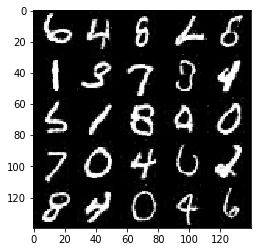

Epoch 18/20..., step 32500 Discriminator Loss: 0.5367... Generator Loss: 2.2477


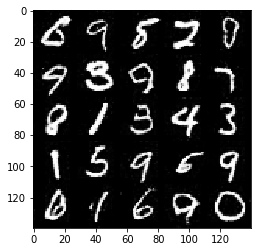

Epoch 18/20..., step 32600 Discriminator Loss: 0.6328... Generator Loss: 1.6668


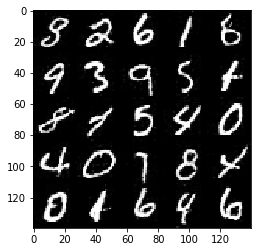

Epoch 18/20..., step 32700 Discriminator Loss: 0.7127... Generator Loss: 1.3569


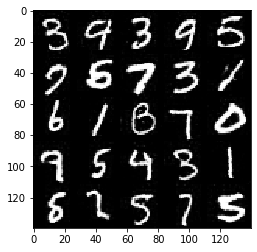

Epoch 18/20..., step 32800 Discriminator Loss: 0.5162... Generator Loss: 2.1320


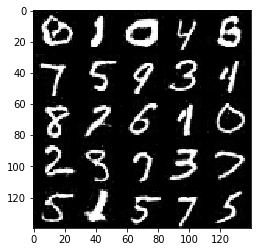

Epoch 18/20..., step 32900 Discriminator Loss: 0.7193... Generator Loss: 1.3712


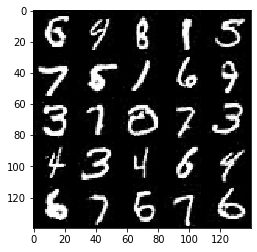

Epoch 18/20..., step 33000 Discriminator Loss: 0.8853... Generator Loss: 1.1071


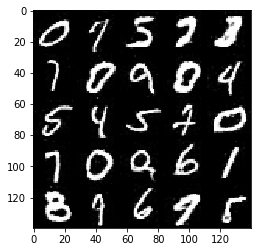

Epoch 18/20..., step 33100 Discriminator Loss: 0.6106... Generator Loss: 2.0137


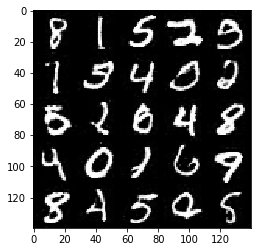

Epoch 18/20..., step 33200 Discriminator Loss: 0.5344... Generator Loss: 2.1369


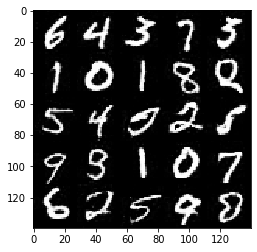

Epoch 18/20..., step 33300 Discriminator Loss: 0.5923... Generator Loss: 1.8243


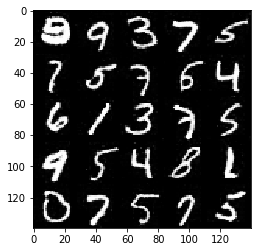

Epoch 18/20..., step 33400 Discriminator Loss: 0.6353... Generator Loss: 1.6068


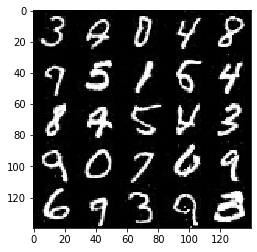

Epoch 18/20..., step 33500 Discriminator Loss: 0.6655... Generator Loss: 1.6007


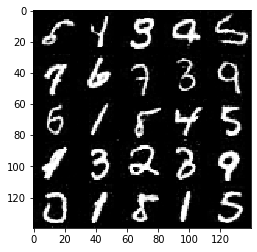

Epoch 18/20..., step 33600 Discriminator Loss: 0.4436... Generator Loss: 2.7187


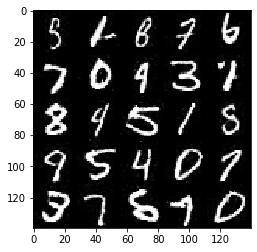

Epoch 18/20..., step 33700 Discriminator Loss: 0.7319... Generator Loss: 1.2870


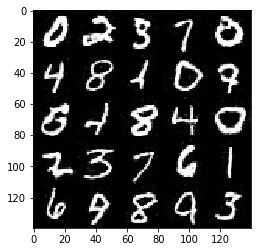

Epoch 19/20..., step 33800 Discriminator Loss: 0.5161... Generator Loss: 2.0679


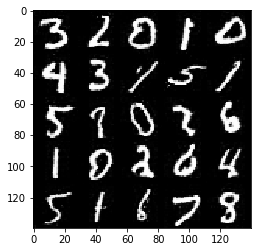

Epoch 19/20..., step 33900 Discriminator Loss: 0.7395... Generator Loss: 1.2931


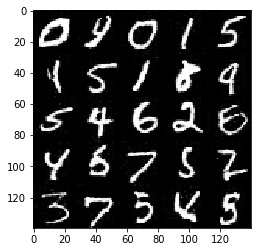

Epoch 19/20..., step 34000 Discriminator Loss: 0.8291... Generator Loss: 1.1373


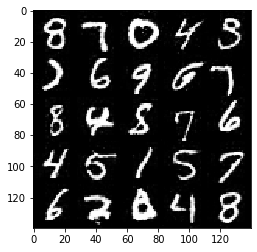

Epoch 19/20..., step 34100 Discriminator Loss: 0.5407... Generator Loss: 1.8806


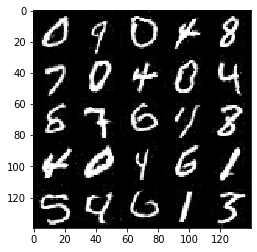

Epoch 19/20..., step 34200 Discriminator Loss: 0.6068... Generator Loss: 1.6413


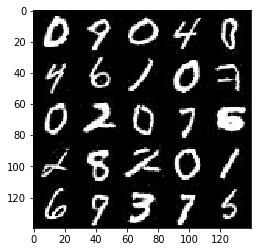

Epoch 19/20..., step 34300 Discriminator Loss: 0.7511... Generator Loss: 1.3370


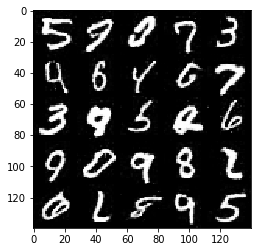

Epoch 19/20..., step 34400 Discriminator Loss: 0.6317... Generator Loss: 1.6165


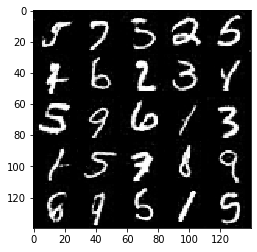

Epoch 19/20..., step 34500 Discriminator Loss: 0.4928... Generator Loss: 2.2039


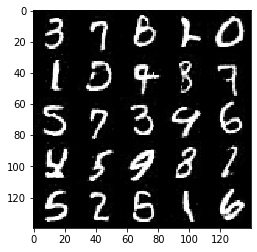

Epoch 19/20..., step 34600 Discriminator Loss: 0.8903... Generator Loss: 1.0906


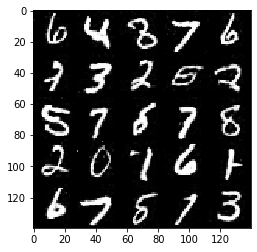

Epoch 19/20..., step 34700 Discriminator Loss: 0.5296... Generator Loss: 2.0677


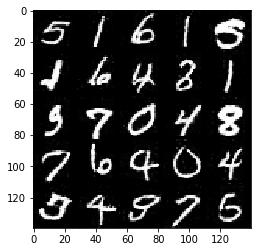

Epoch 19/20..., step 34800 Discriminator Loss: 0.9189... Generator Loss: 1.0811


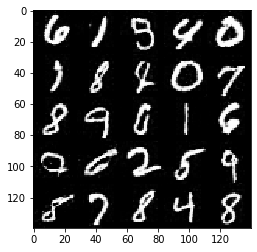

Epoch 19/20..., step 34900 Discriminator Loss: 0.6735... Generator Loss: 1.6660


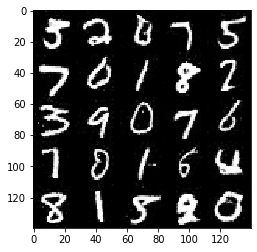

Epoch 19/20..., step 35000 Discriminator Loss: 0.7183... Generator Loss: 1.7781


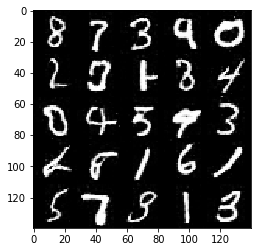

Epoch 19/20..., step 35100 Discriminator Loss: 0.4402... Generator Loss: 2.6546


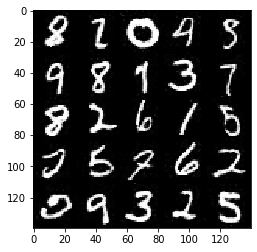

Epoch 19/20..., step 35200 Discriminator Loss: 0.6799... Generator Loss: 1.4571


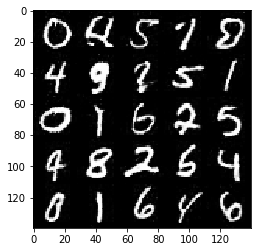

Epoch 19/20..., step 35300 Discriminator Loss: 0.4802... Generator Loss: 2.2364


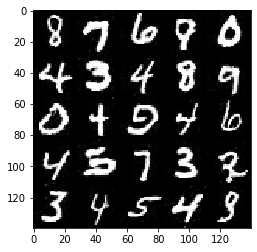

Epoch 19/20..., step 35400 Discriminator Loss: 0.6654... Generator Loss: 1.5151


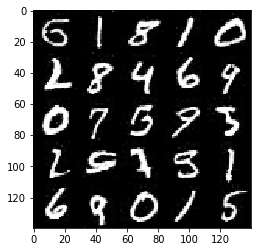

Epoch 19/20..., step 35500 Discriminator Loss: 0.5217... Generator Loss: 1.9978


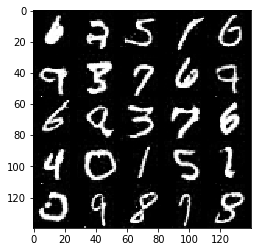

Epoch 19/20..., step 35600 Discriminator Loss: 0.6360... Generator Loss: 1.7350


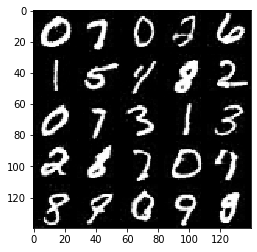

Epoch 20/20..., step 35700 Discriminator Loss: 0.4218... Generator Loss: 2.7622


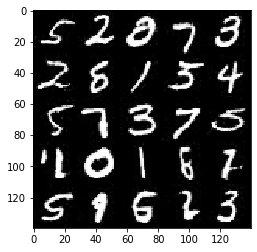

Epoch 20/20..., step 35800 Discriminator Loss: 0.6203... Generator Loss: 1.6314


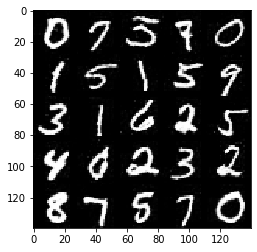

Epoch 20/20..., step 35900 Discriminator Loss: 0.7819... Generator Loss: 1.3335


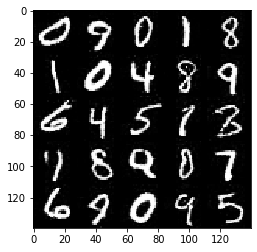

Epoch 20/20..., step 36000 Discriminator Loss: 0.6827... Generator Loss: 1.5324


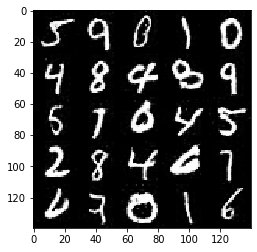

Epoch 20/20..., step 36100 Discriminator Loss: 0.5068... Generator Loss: 2.1011


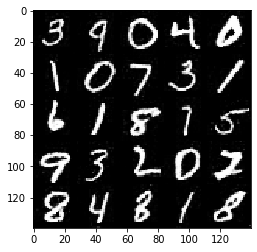

Epoch 20/20..., step 36200 Discriminator Loss: 0.4966... Generator Loss: 2.3488


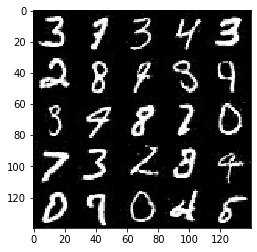

Epoch 20/20..., step 36300 Discriminator Loss: 0.5280... Generator Loss: 2.0637


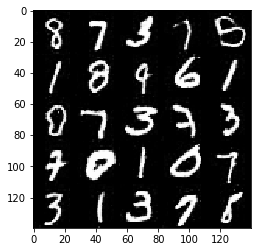

Epoch 20/20..., step 36400 Discriminator Loss: 0.5861... Generator Loss: 2.2982


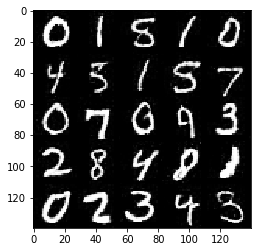

Epoch 20/20..., step 36500 Discriminator Loss: 0.6400... Generator Loss: 1.5433


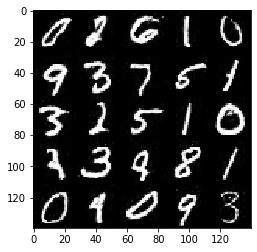

Epoch 20/20..., step 36600 Discriminator Loss: 0.4544... Generator Loss: 2.4227


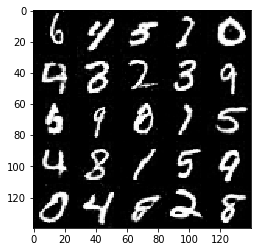

Epoch 20/20..., step 36700 Discriminator Loss: 0.5451... Generator Loss: 1.9310


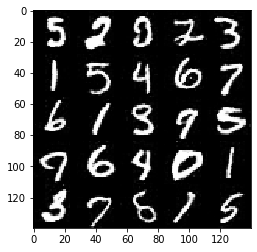

Epoch 20/20..., step 36800 Discriminator Loss: 0.5899... Generator Loss: 1.9866


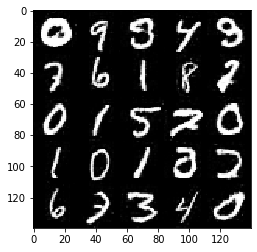

Epoch 20/20..., step 36900 Discriminator Loss: 0.6055... Generator Loss: 1.6423


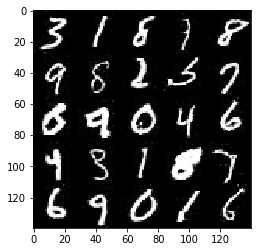

Epoch 20/20..., step 37000 Discriminator Loss: 0.8017... Generator Loss: 1.1812


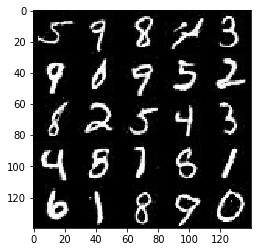

Epoch 20/20..., step 37100 Discriminator Loss: 0.5496... Generator Loss: 1.9709


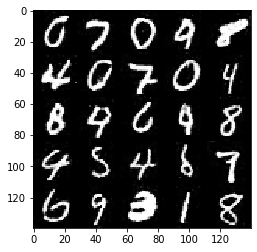

Epoch 20/20..., step 37200 Discriminator Loss: 0.5617... Generator Loss: 1.9946


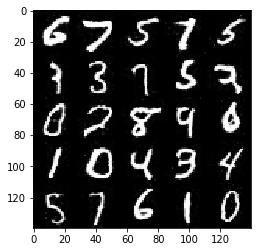

Epoch 20/20..., step 37300 Discriminator Loss: 0.4697... Generator Loss: 2.3793


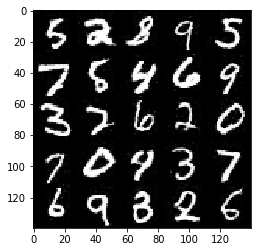

Epoch 20/20..., step 37400 Discriminator Loss: 0.9692... Generator Loss: 0.8637


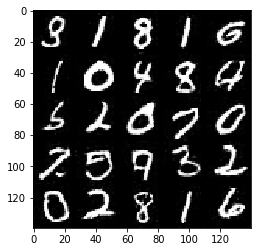

Epoch 20/20..., step 37500 Discriminator Loss: 0.5281... Generator Loss: 2.2627


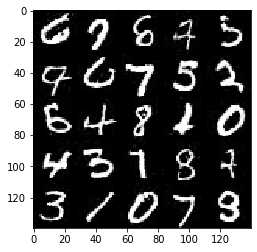

In [27]:
batch_size = 32
z_dim = 128
learning_rate = .0002
beta1 = .5


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 20

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)